In [1]:

#train_dataset_dir = 'data/leftImg8bit/train_ds/'
train_dataset_dir = 'data/lyft_training_data/Train/CameraRGB/'


val_dataset_dir = 'data/lyft_training_data/Test/CameraRGB/'


gt_dataset_dir = 'data/lyft_training_data/Train/CameraSeg/'

In [2]:
import time
import os.path
import os

#import helper_cityscapes as helper
import helper_lyft as helper
import numpy as np

import warnings
import scipy.misc
import tensorflow as tf
from datetime import timedelta
from distutils.version import LooseVersion

import keras
from keras import backend as K
from tensorflow.python.framework import graph_util
from tensorflow.python.framework import graph_io
from keras.models import load_model
from keras.models import Model, Sequential
from keras.layers import Dense, Flatten, Dropout, Input, GlobalAveragePooling2D
from keras.layers import Conv2D, MaxPooling2D, Activation, Lambda, concatenate, ELU
from keras.callbacks import ModelCheckpoint, EarlyStopping, Callback
from keras import optimizers
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Convolution2D, MaxPooling2D, Concatenate, merge, AveragePooling2D, ZeroPadding2D


# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))


# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

/disk300g/installed/anaconda2/envs/OD-lab-py35/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


TensorFlow Version: 1.7.0
Default GPU Device: /device:GPU:0


In [3]:
L2_REG = 1e-6
STDEV = 1e-3
KEEP_PROB = 0.5
LEARNING_RATE = 1e-4

EPOCHS = 1 #3 #1  #3 #50 #10 #30

BATCH_SIZE = 16 #8 #2 #16

# ?? why (600,800) leads to Incompatible shapes: [8,76,100,3] vs. [8,75,100,3]  ??
IMAGE_SHAPE = (256, 512) #(600, 800) #(256, 512)

NUM_CLASSES = 3

DATA_DIR = './data'
RUNS_DIR = './runs_lyft'
MODEL_DIR = './models_lyft'

log_dir = './log'

In [4]:
output_dir = os.path.join(RUNS_DIR, str(time.time()))
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir)

In [5]:
# import the inspect_checkpoint library
from tensorflow.python.tools import inspect_checkpoint as chkp

# print all tensors in checkpoint file
#chkp.print_tensors_in_checkpoint_file("/tmp/model.ckpt", tensor_name='w1', all_tensor_names=False, all_tensors=False)

chkp.print_tensors_in_checkpoint_file("./models_lyft/cont_epoch_19.ckpt", tensor_name='w1', all_tensor_names=False, all_tensors=False)

#chkp.print_tensors_in_checkpoint_file("./models_lyft/cont_epoch_0.ckpt", tensor_name='w1', all_tensor_names=False, all_tensors=False)
#chkp.print_tensors_in_checkpoint_file("./models_lyft/cont_epoch_9.ckpt", tensor_name='w1', all_tensor_names=False, all_tensors=False)

#chkp.print_tensors_in_checkpoint_file("./models_lyft/cont_epoch_49.ckpt", tensor_name='w1', all_tensor_names=False, all_tensors=False)

#chkp.print_tensors_in_checkpoint_file("./models_lyft/cont_epoch_39.ckpt", tensor_name='w1', all_tensor_names=False, all_tensors=False)


Unsuccessful TensorSliceReader constructor: Failed to find any matching files for ./models_lyft/cont_epoch_19.ckpt


In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
%matplotlib inline

def showim(img):
    img_prep = np.concatenate((img, img, img), axis =2)
    plt.figure()
    plt.imshow(img_prep, cmap='gray')
    plt.show()

def showimg(img):
    plt.figure()
    plt.imshow(img)
    plt.show()

In [7]:
import sys, skvideo.io, json, base64
import numpy as np
from PIL import Image
from io import BytesIO, StringIO

In [8]:
import time
import os.path
import os

#import helper_cityscapes as helper
import helper_lyft as helper
import numpy as np

import warnings
import scipy.misc
import tensorflow as tf
from datetime import timedelta
from distutils.version import LooseVersion

In [9]:
def encode(array):
    pil_img = Image.fromarray(array)
    #print("pil_img shape:", pil_img.shape)
    buff = BytesIO()
    
    
    #if pil_img.mode != 'RGB':
    #    pil_img = pil_img.convert('RGB')
    
    #print("pil_img RGB shape:", pil_img.shape)
    pil_img.save(buff, format="PNG")
    return base64.b64encode(buff.getvalue()).decode("utf-8")

In [10]:
import cv2
def cv2_encode(array):
    retval, buffer = cv2.imencode('.png', array)
    return base64.b64encode(buffer).decode("utf-8")

In [11]:
cropped_zeros = np.zeros((100, 800))

IMAGE_SHAPE = (256, 512) #(600, 800) #(256, 512)

NUM_CLASSES = 3

DATA_DIR = './data'
RUNS_DIR = './runs_lyft'
MODEL_DIR = './models_lyft'

log_dir = './log'

output_dir = os.path.join(RUNS_DIR, str(time.time()))
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir)

In [13]:
def single_img_inference(img, image_shape, sess, image_place_holder, logits, keep_prob):

    #print("input image shape:", img.shape)        
    # (600, 800)
    #showimg(img)
    
    
    street_im = scipy.misc.toimage(img)
        
        
    # (400, 800)
    crop_img = img[100:500,:,:]
    showimg(crop_img)
    
    # (400, 800) to (256, 512)
    image = scipy.misc.imresize(crop_img, image_shape)
    showimg(image)
    
    im_softmax = sess.run([tf.nn.softmax(logits)], {keep_prob: 1.0, input: [image]})
    
    ###################
    
    # Road
    im_softmax_r = im_softmax[0][:, 0].reshape(IMAGE_SHAPE[0], IMAGE_SHAPE[1]) # (256, 512)
    

    im_softmax_r_1 =  (im_softmax_r > 0.5).reshape(IMAGE_SHAPE[0], IMAGE_SHAPE[1], 1) # (256, 512, 1)
        

    road_img_int = im_softmax_r_1.astype(np.uint8)*255
    print("road_img_int.shape : ", road_img_int.shape)
    showim(road_img_int)
        
    img_prep = np.concatenate((road_img_int, road_img_int, road_img_int), axis =2)
    resize_road = scipy.misc.imresize( img_prep , crop_img.shape) # (  400, 800 , 3)
    showimg(resize_road)  # (400, 800, 3)

    # 0 and 255
    resize_road_int = resize_road[:,:,0]  # (400, 800)
    padding_road_int = np.concatenate((cropped_zeros, resize_road_int),axis=0)
    padding_road_int = np.concatenate((padding_road_int,cropped_zeros),axis=0) # (600,800)
    showimg(padding_road_int)

    padding_road_int_1 = padding_road_int[:, :, np.newaxis]
    print("padding_road_int_1.shape : ", padding_road_int_1.shape)
    showim(padding_road_int_1)
        
    mask = np.dot(padding_road_int_1, np.array([[128, 64, 128, 64]])) 
    mask = scipy.misc.toimage(mask, mode="RGBA")
    showimg(mask)
    street_im.paste(mask, box=None, mask=mask)
    showimg(street_im)
    
    # binary 0, 1:  
    padding_road_int[padding_road_int == 255]=1
    binary_padding_road = padding_road_int.astype('uint8')
    #print("binary_padding_road: ", binary_padding_road.shape, binary_padding_road)
    


        
    ###########################

    
    # 1 fo car
    im_softmax_c = im_softmax[0][:, 1].reshape(IMAGE_SHAPE[0], IMAGE_SHAPE[1])

    im_softmax_c_1 =  (im_softmax_c > 0.5).reshape(IMAGE_SHAPE[0], IMAGE_SHAPE[1], 1) # (256, 512, 1)
    car_img_int = im_softmax_c_1.astype(np.uint8)*255
    showim(car_img_int)
        
    img_prep = np.concatenate((car_img_int, car_img_int, car_img_int), axis =2)
    resize_car = scipy.misc.imresize( img_prep , (400,800,3)) # (  400, 800 , 3)
    showimg(resize_car)  # (400, 800, 3)
        
    # 0 and 255
    #padding_car_int = decrop(resize_car) # (600 ,800)
    resize_car_int = resize_car[:,:,0]  # (400, 800)
    padding_car_int = np.concatenate((cropped_zeros, resize_car_int),axis=0)
    padding_car_int = np.concatenate((padding_car_int,cropped_zeros),axis=0) # (600,800)
    
    padding_car_int_1 = padding_car_int[:, :, np.newaxis]
    print("padding_car_int_1.shape : ", padding_car_int_1.shape)
    showim(padding_car_int_1) # (600, 800 , 1)
    
    mask = np.dot(padding_car_int_1, np.array([[0, 0, 142, 64]]))
    mask = scipy.misc.toimage(mask, mode="RGBA")
    showimg(mask)
    street_im.paste(mask, box=None, mask=mask)
    showimg(street_im)
    
    # binary 0, 1:  
    #binary_padding_car
    padding_car_int[padding_car_int == 255]=1
    binary_padding_car = padding_car_int.astype('uint8')
    #print("binary_padding_car: ", binary_padding_car.shape, binary_padding_car)
    

        
  


    ##################################
    
    #scipy.misc.imsave(os.path.join(output_dir), street_im)
    
    # 0, 1
    return binary_padding_road, binary_padding_car
    #return padding_car_int_1, padding_road_int_1
    
    # 0 -255
    #return padding_road_int, padding_car_int # need convert pil_img to RGB mode
    
    #return np.array(street_im)



INFO:tensorflow:Restoring parameters from ./models_lyft/20epoch/cont_epoch_19.ckpt


/home/ubuntu/.local/lib/python3.5/site-packages/ipykernel_launcher.py:8: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.
  


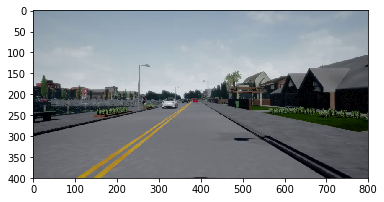

/home/ubuntu/.local/lib/python3.5/site-packages/ipykernel_launcher.py:16: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  app.launch_new_instance()


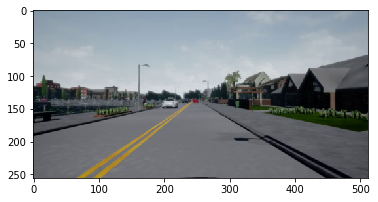

road_img_int.shape :  (256, 512, 1)


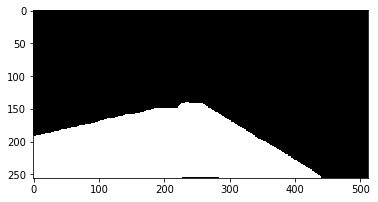

/home/ubuntu/.local/lib/python3.5/site-packages/ipykernel_launcher.py:41: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


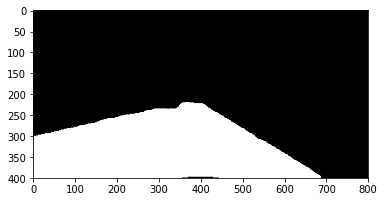

padding_XXX_int.shape :  (600, 800)


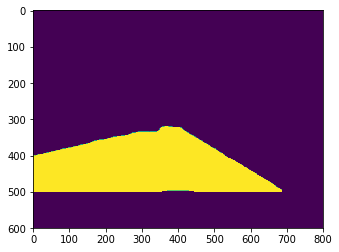

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


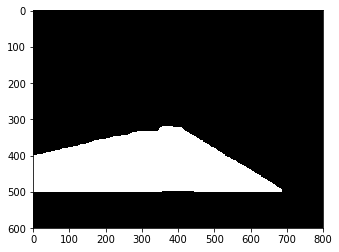

/home/ubuntu/.local/lib/python3.5/site-packages/ipykernel_launcher.py:53: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


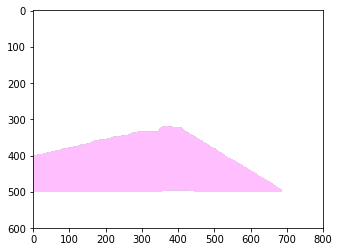

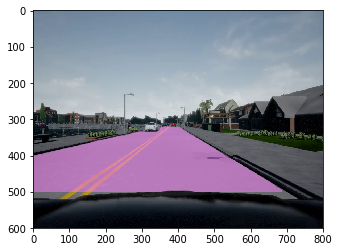

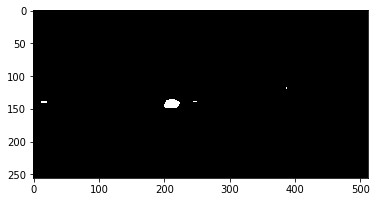

/home/ubuntu/.local/lib/python3.5/site-packages/ipykernel_launcher.py:77: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.


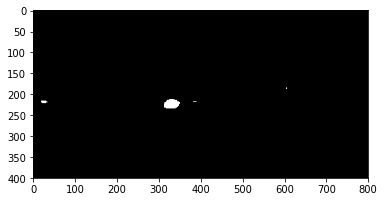

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


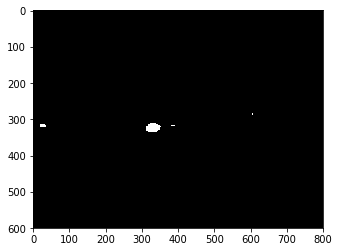

/home/ubuntu/.local/lib/python3.5/site-packages/ipykernel_launcher.py:98: DeprecationWarning: `toimage` is deprecated!
`toimage` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use Pillow's ``Image.fromarray`` directly instead.


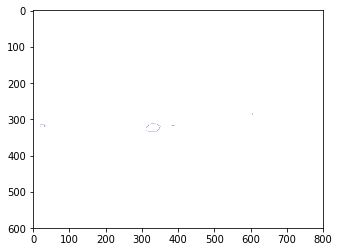

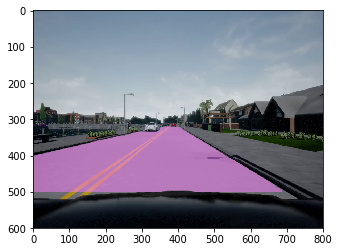

 frame:  1


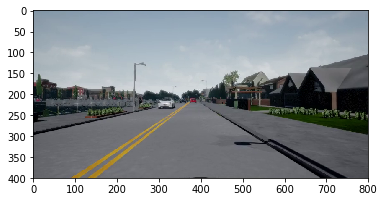

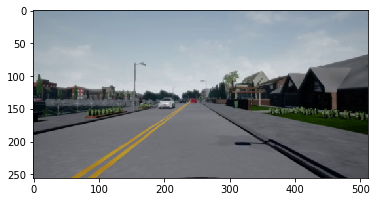

road_img_int.shape :  (256, 512, 1)


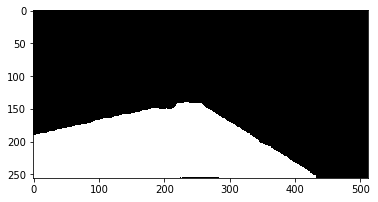

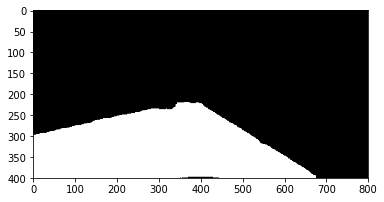

padding_XXX_int.shape :  (600, 800)


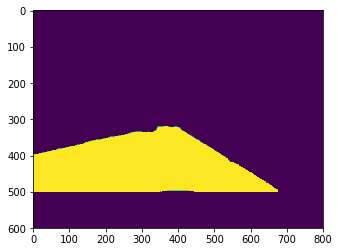

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


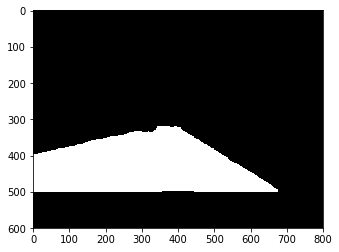

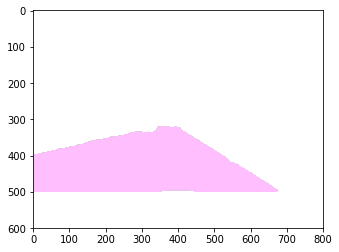

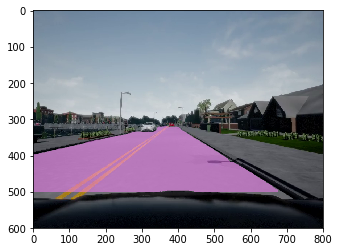

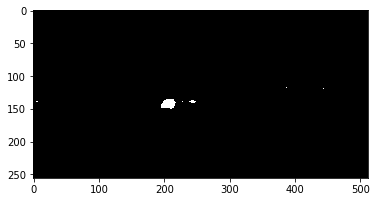

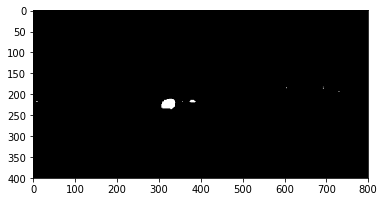

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


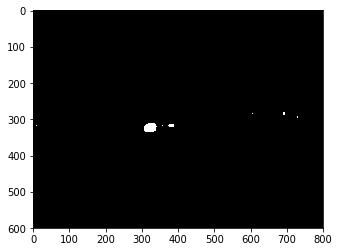

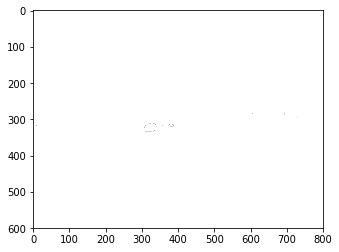

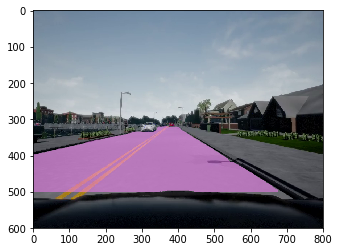

 frame:  2


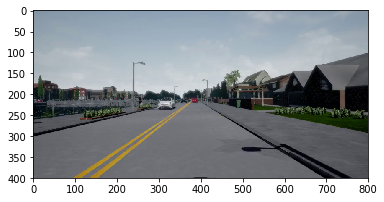

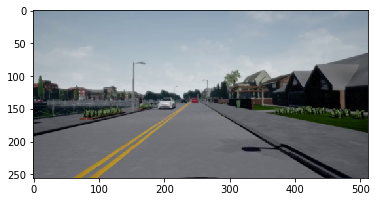

road_img_int.shape :  (256, 512, 1)


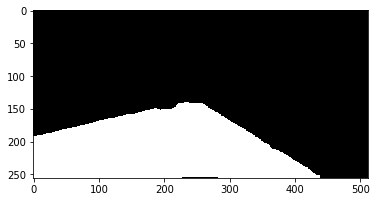

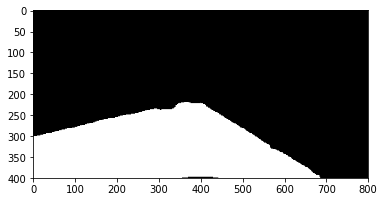

padding_XXX_int.shape :  (600, 800)


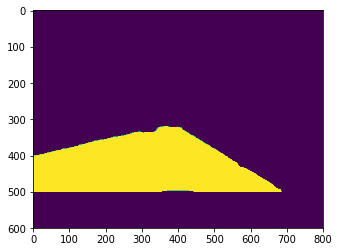

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


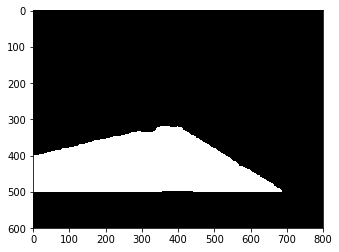

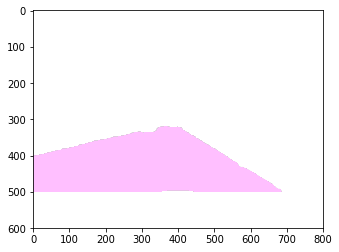

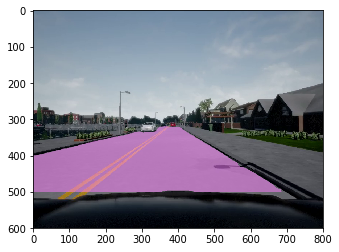

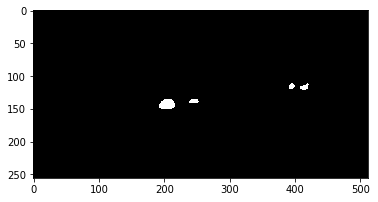

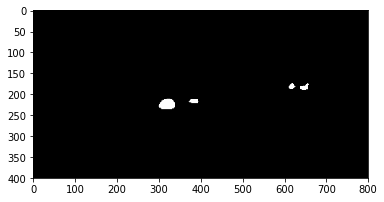

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


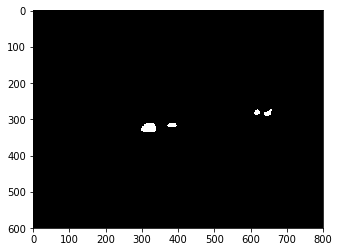

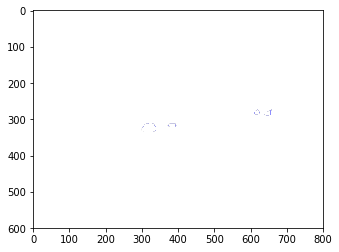

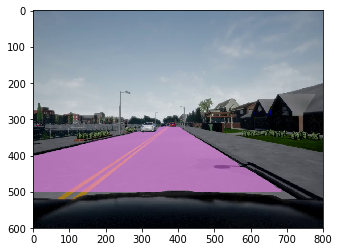

 frame:  3


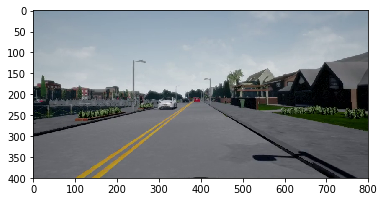

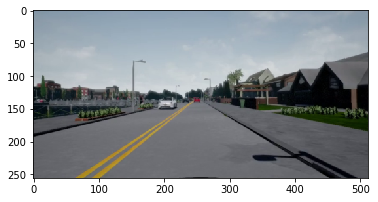

road_img_int.shape :  (256, 512, 1)


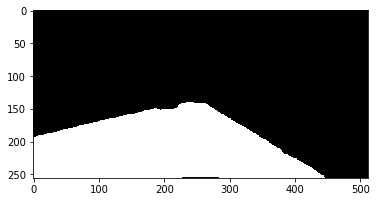

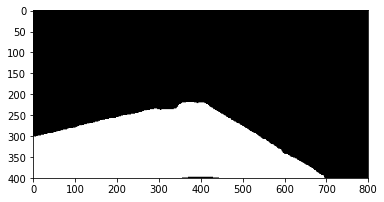

padding_XXX_int.shape :  (600, 800)


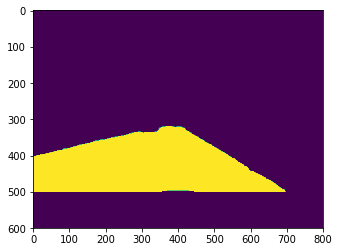

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


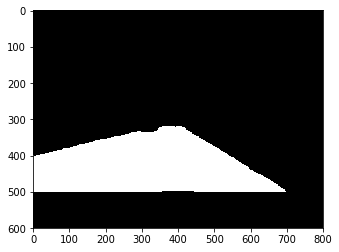

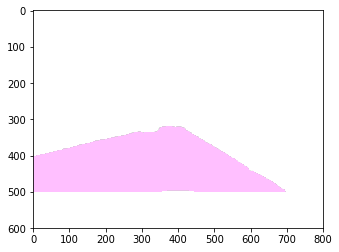

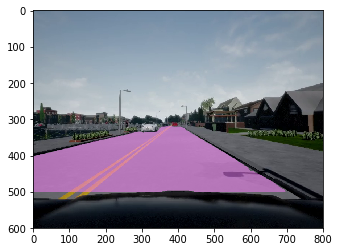

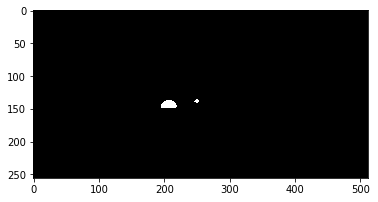

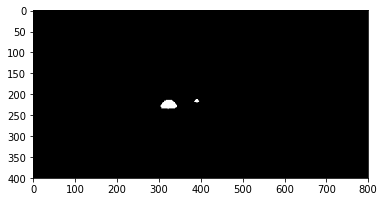

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


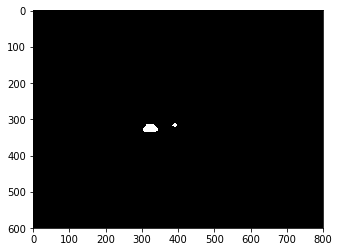

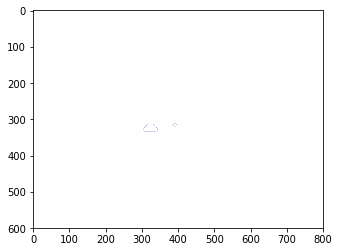

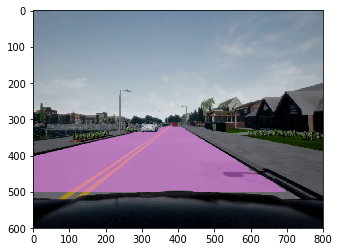

 frame:  4


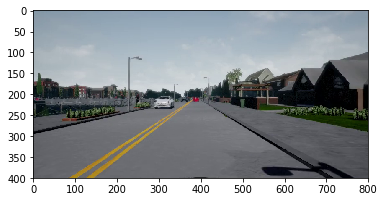

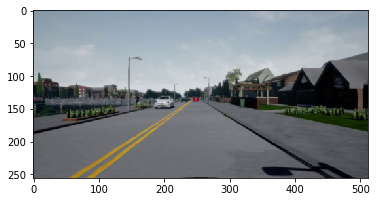

road_img_int.shape :  (256, 512, 1)


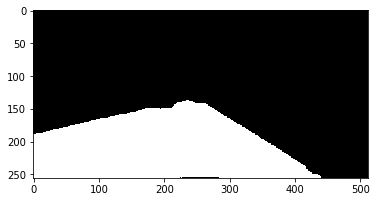

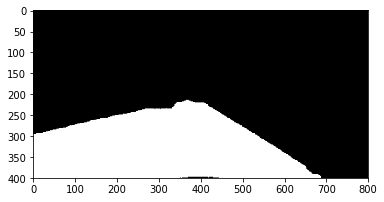

padding_XXX_int.shape :  (600, 800)


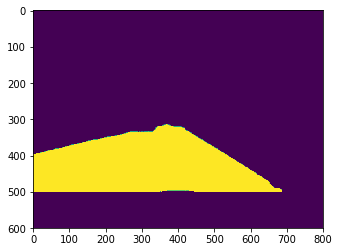

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


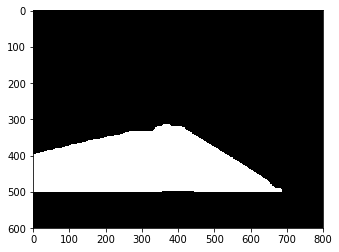

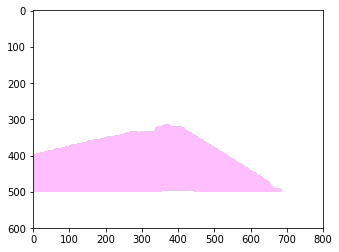

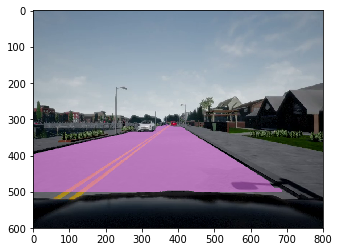

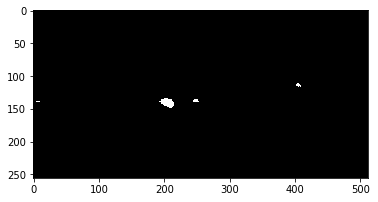

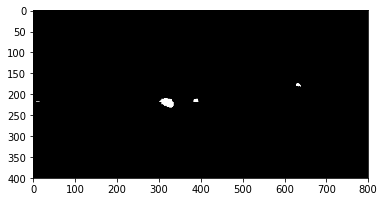

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


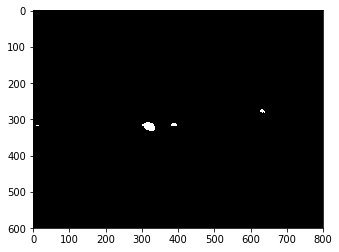

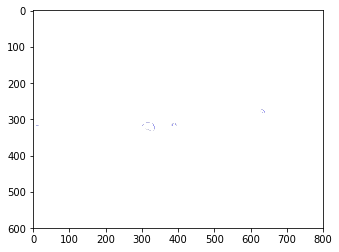

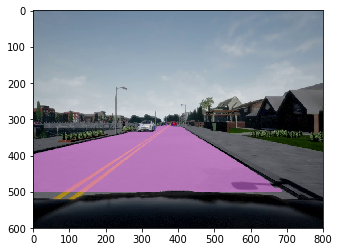

 frame:  5


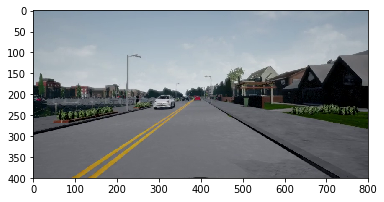

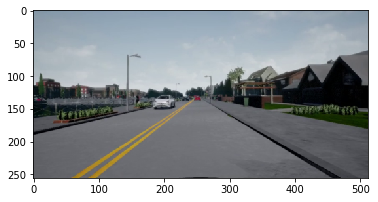

road_img_int.shape :  (256, 512, 1)


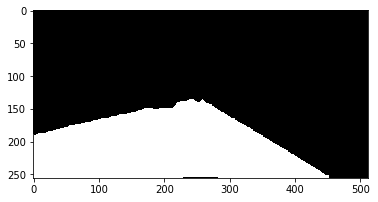

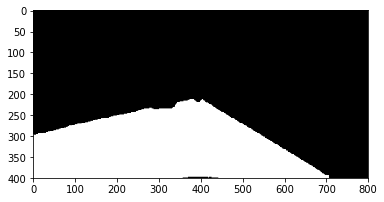

padding_XXX_int.shape :  (600, 800)


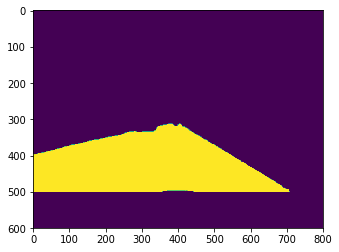

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


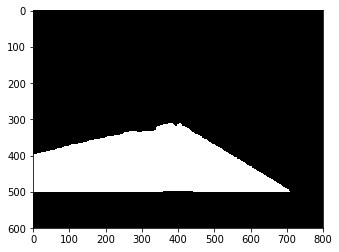

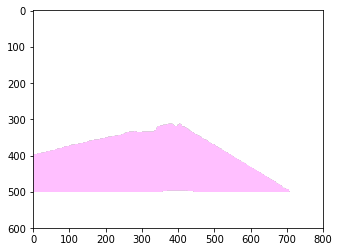

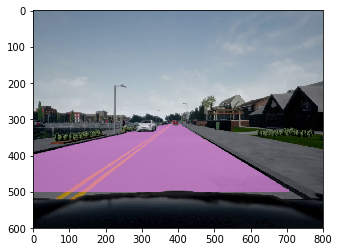

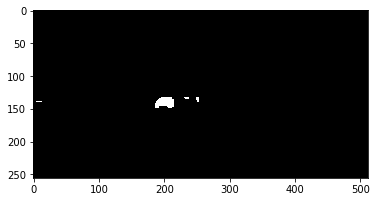

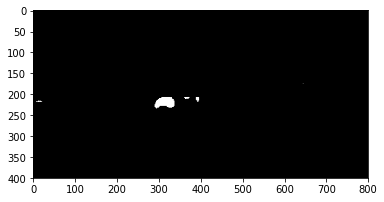

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


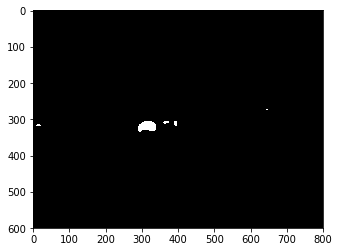

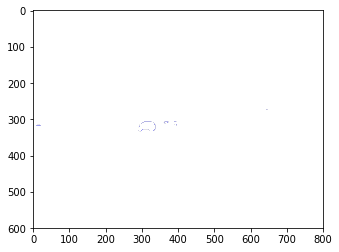

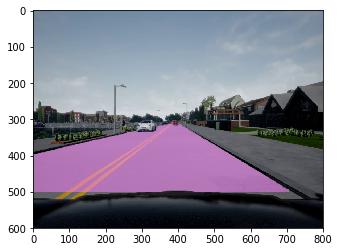

 frame:  6


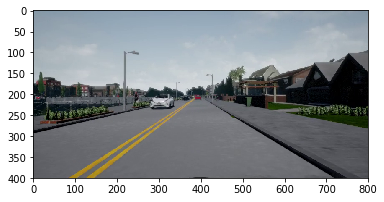

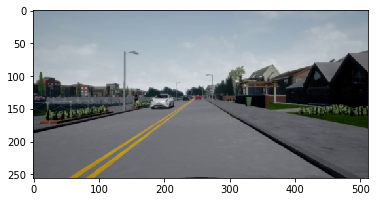

road_img_int.shape :  (256, 512, 1)


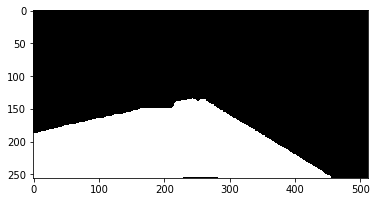

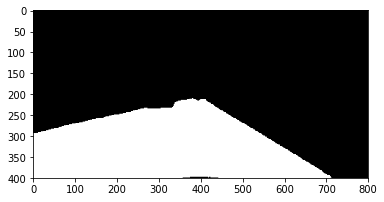

padding_XXX_int.shape :  (600, 800)


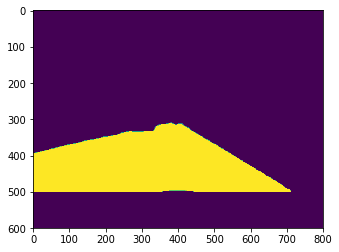

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


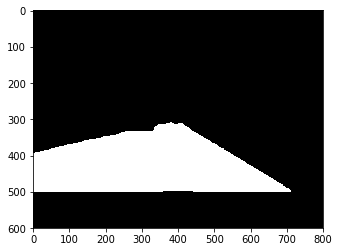

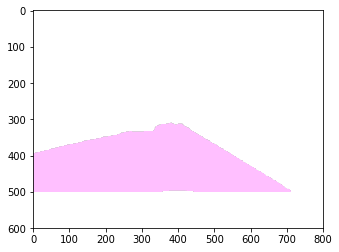

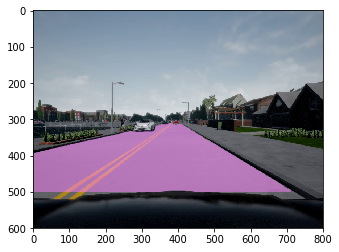

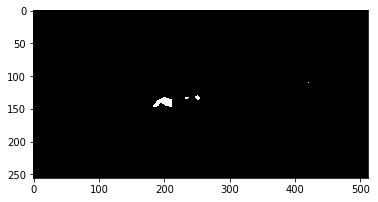

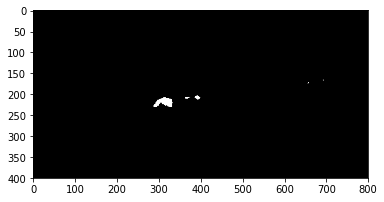

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


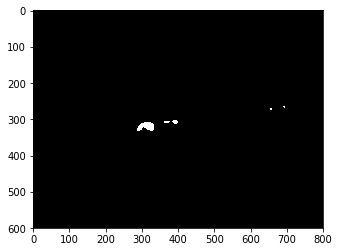

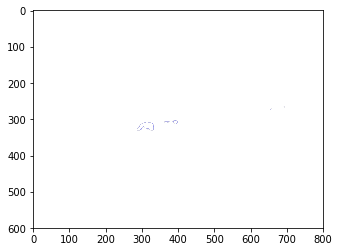

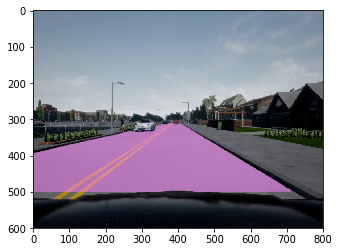

 frame:  7


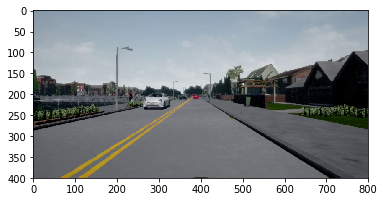

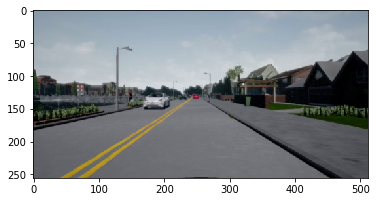

road_img_int.shape :  (256, 512, 1)


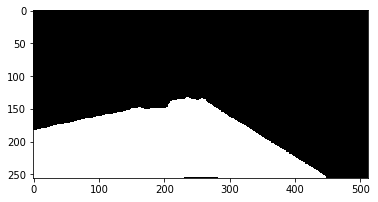

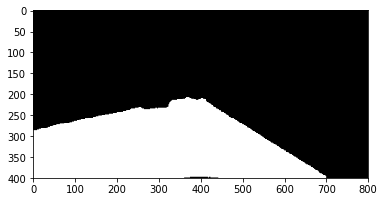

padding_XXX_int.shape :  (600, 800)


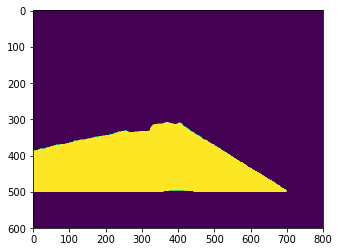

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


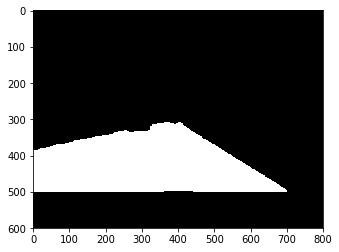

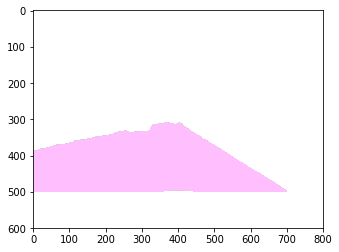

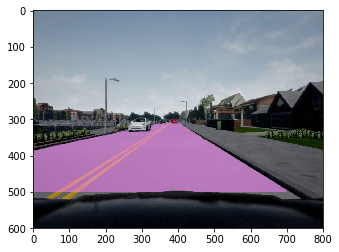

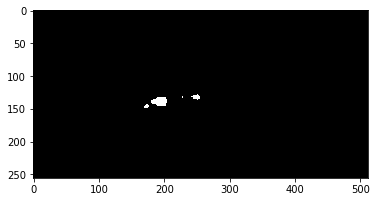

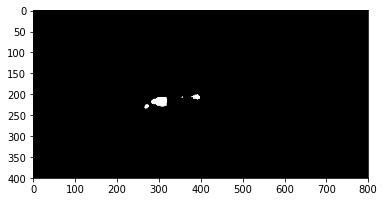

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


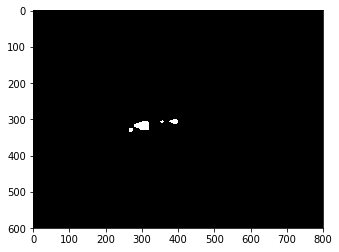

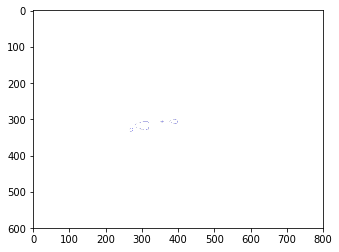

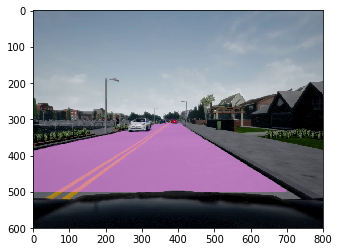

 frame:  8


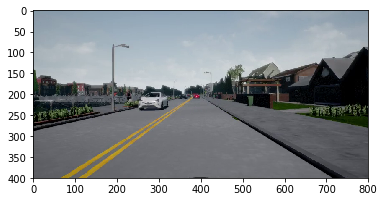

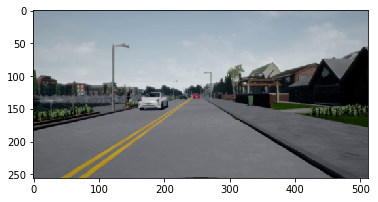

road_img_int.shape :  (256, 512, 1)


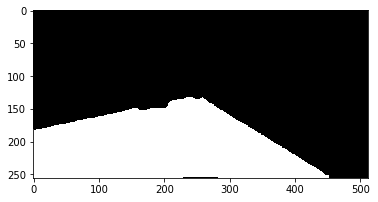

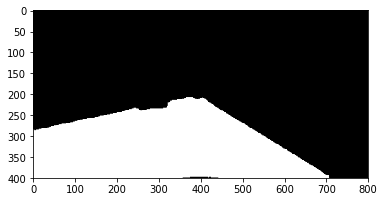

padding_XXX_int.shape :  (600, 800)


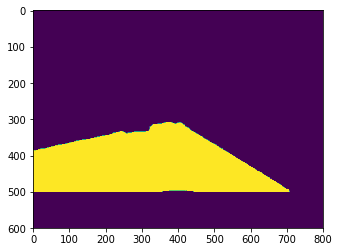

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


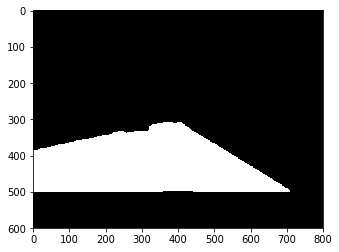

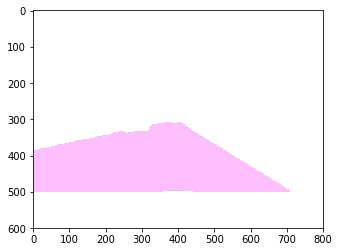

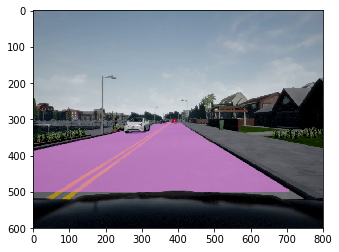

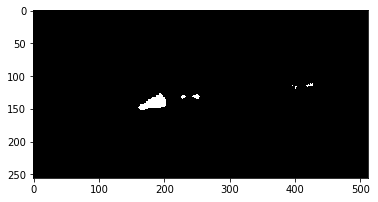

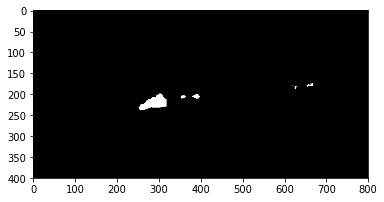

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


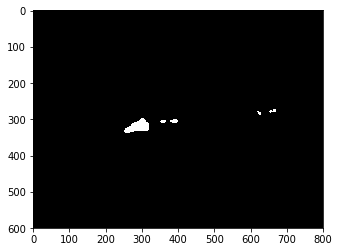

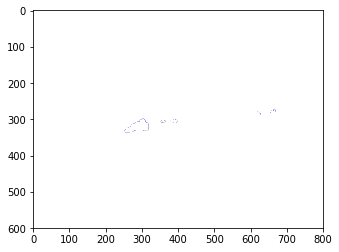

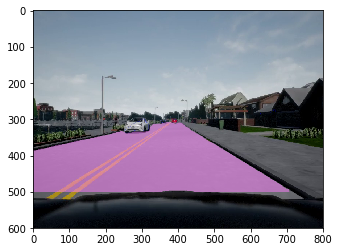

 frame:  9


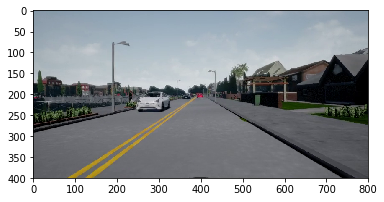

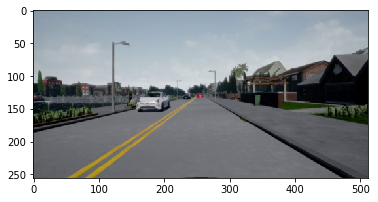

road_img_int.shape :  (256, 512, 1)


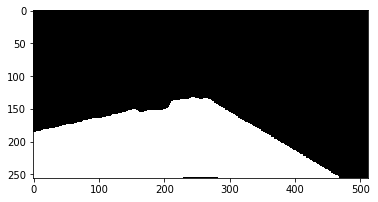

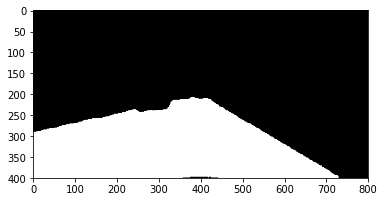

padding_XXX_int.shape :  (600, 800)


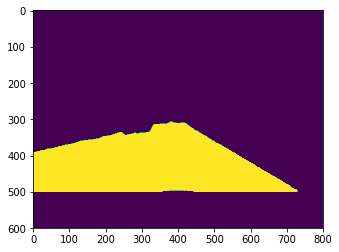

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


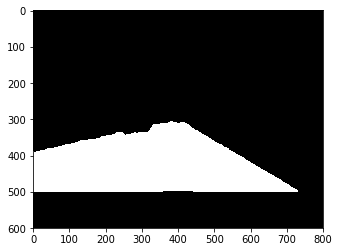

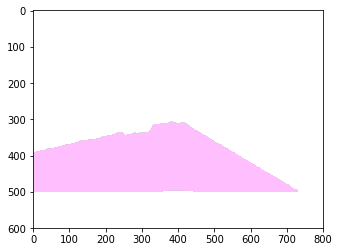

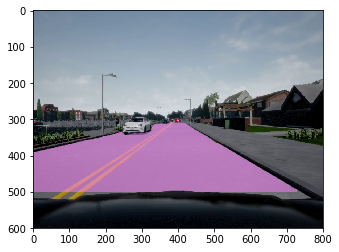

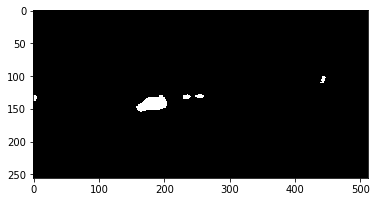

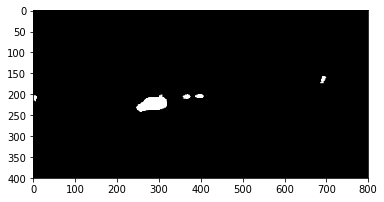

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


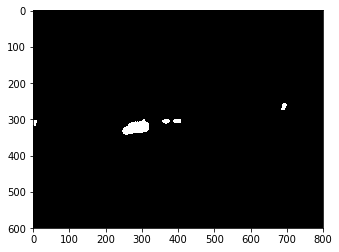

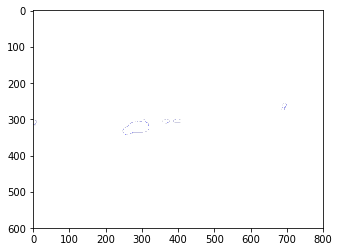

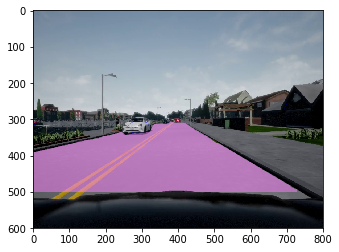

 frame:  10


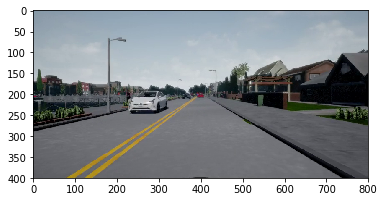

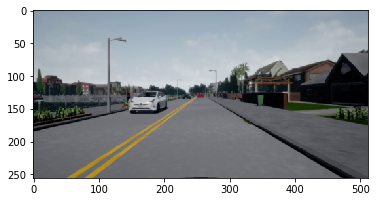

road_img_int.shape :  (256, 512, 1)


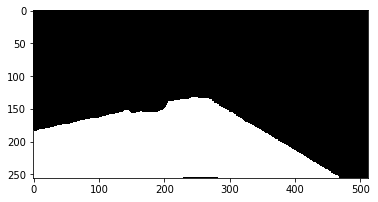

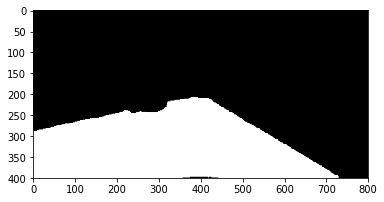

padding_XXX_int.shape :  (600, 800)


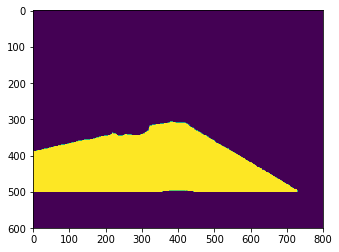

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


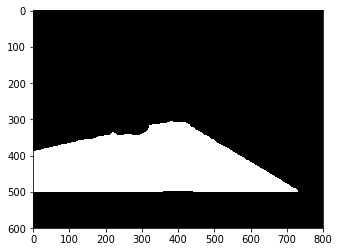

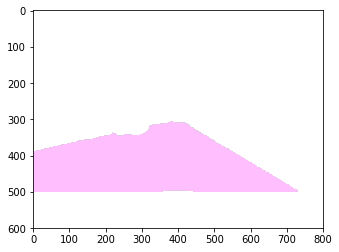

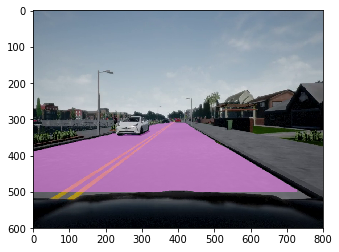

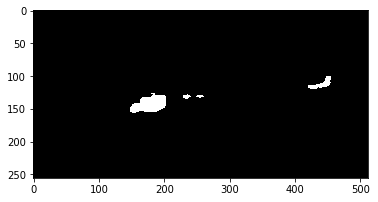

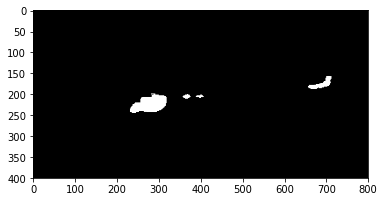

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


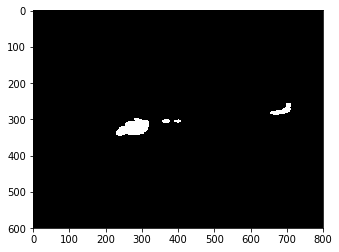

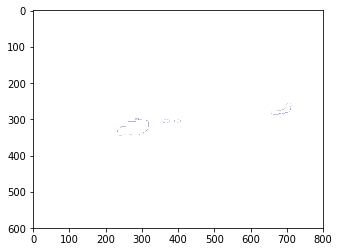

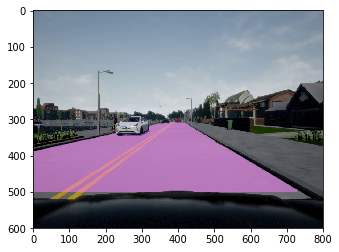

 frame:  11


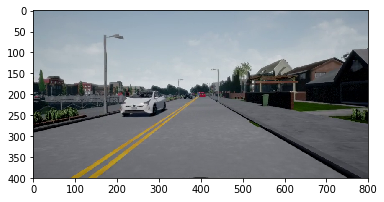

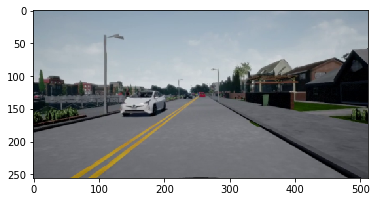

road_img_int.shape :  (256, 512, 1)


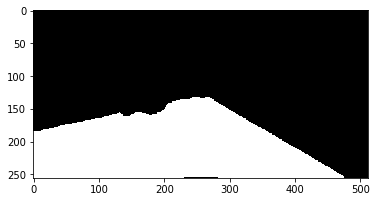

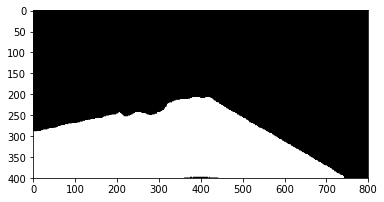

padding_XXX_int.shape :  (600, 800)


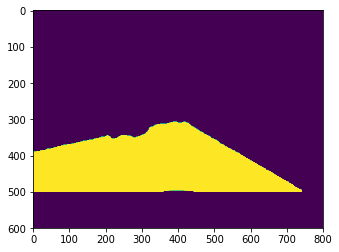

padding_road_int_1.shape :  (600, 800, 1)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


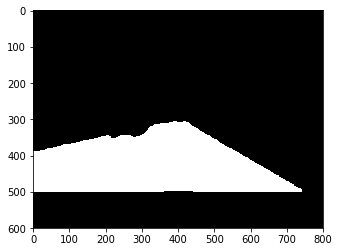

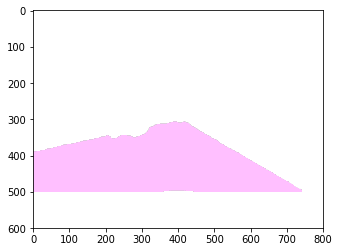

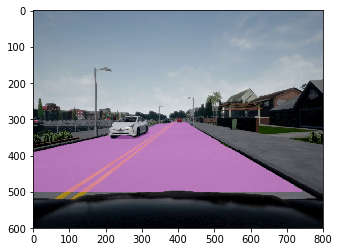

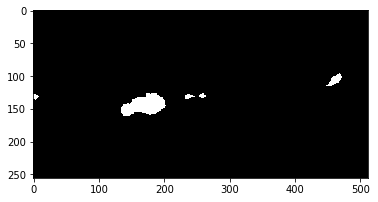

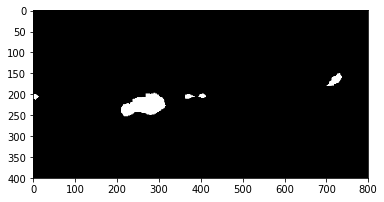

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


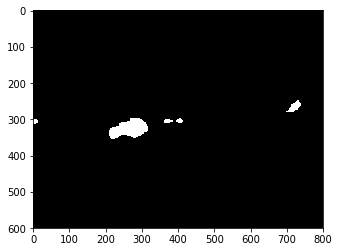

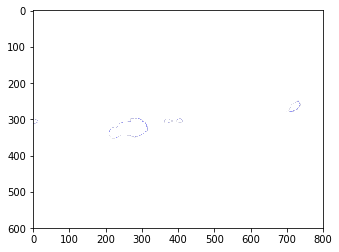

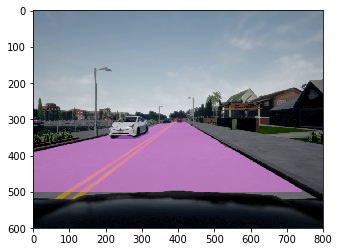

 frame:  12


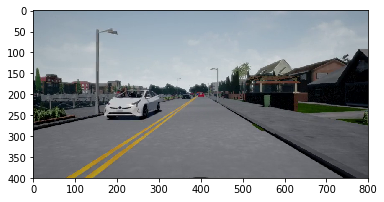

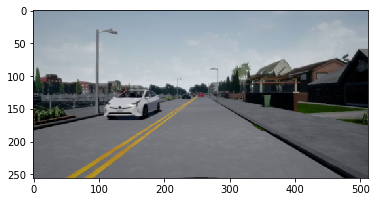

road_img_int.shape :  (256, 512, 1)


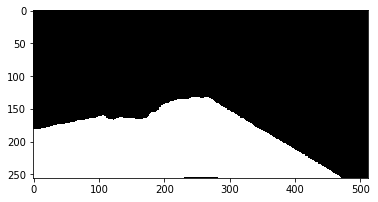

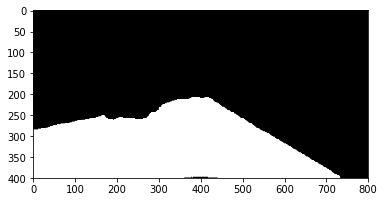

padding_XXX_int.shape :  (600, 800)


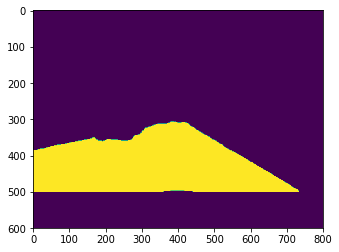

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


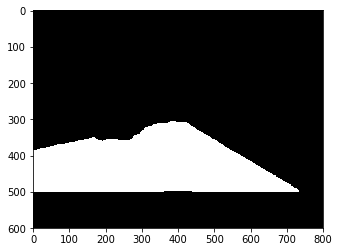

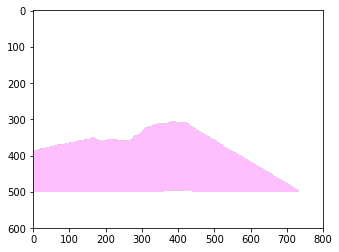

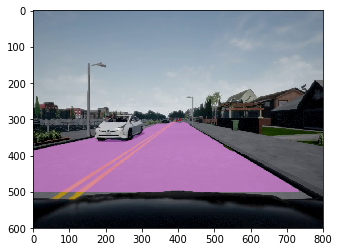

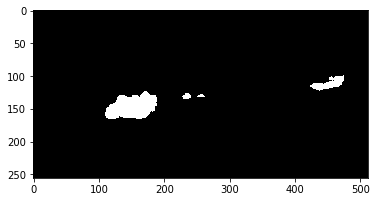

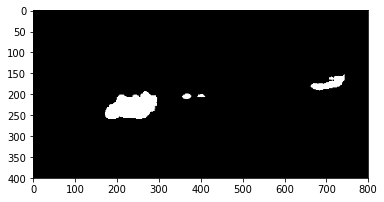

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


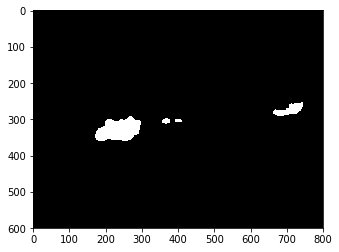

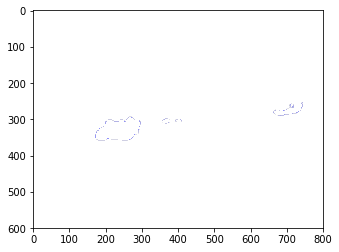

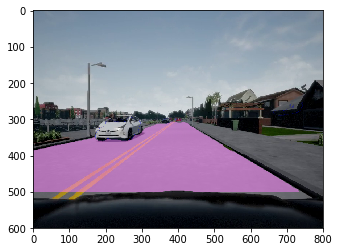

 frame:  13


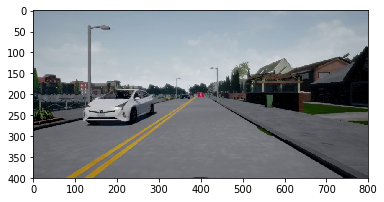

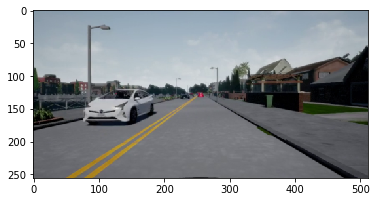

road_img_int.shape :  (256, 512, 1)


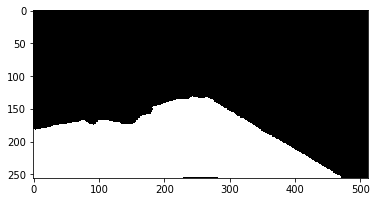

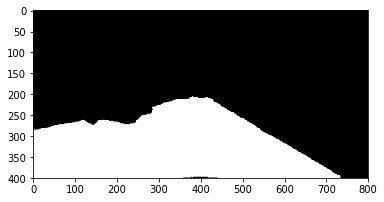

padding_XXX_int.shape :  (600, 800)


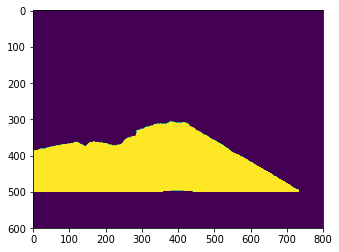

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


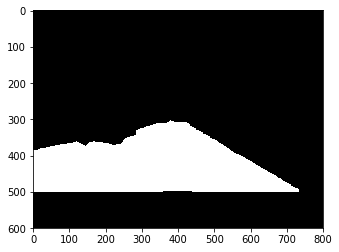

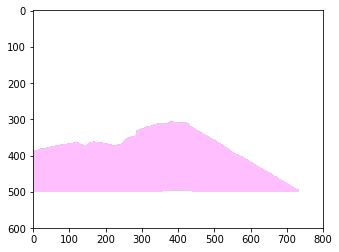

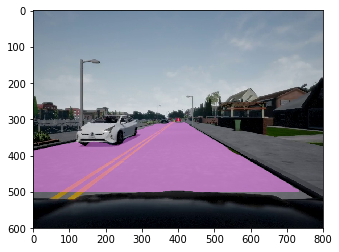

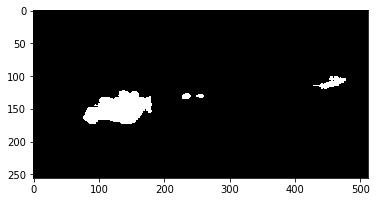

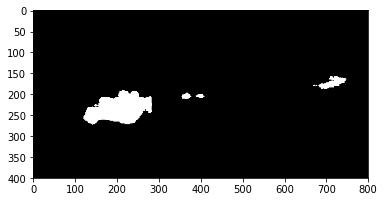

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


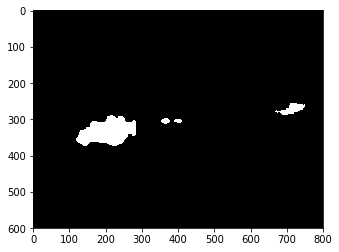

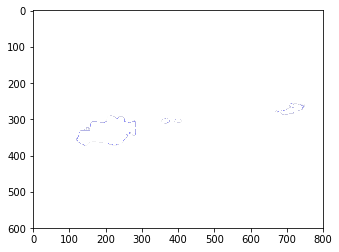

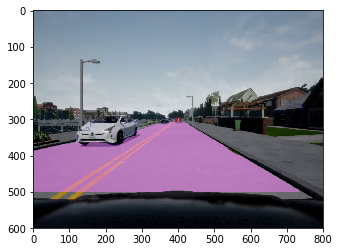

 frame:  14


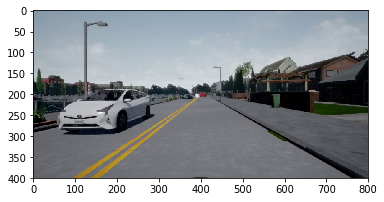

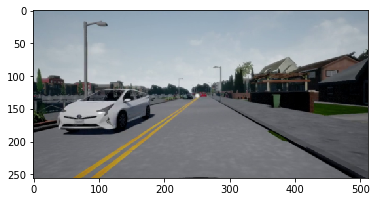

road_img_int.shape :  (256, 512, 1)


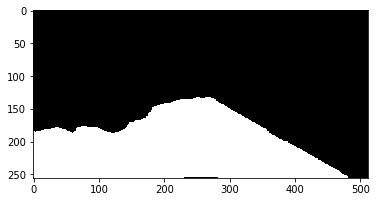

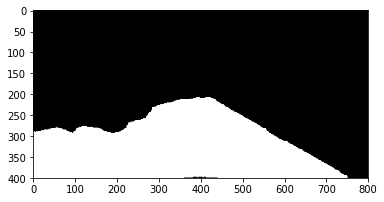

padding_XXX_int.shape :  (600, 800)


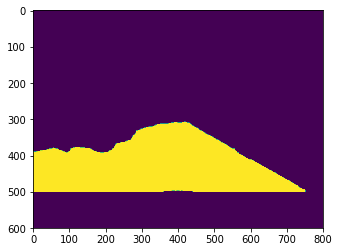

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


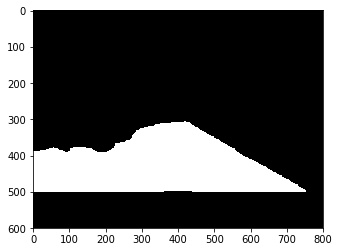

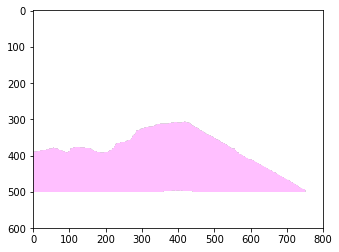

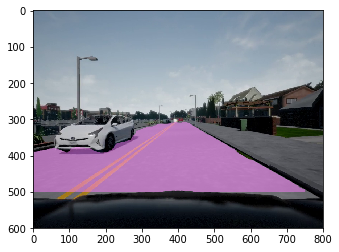

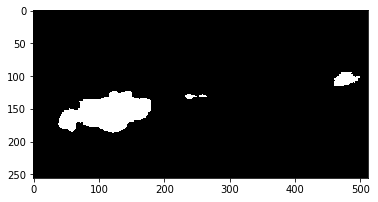

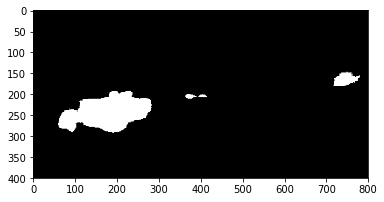

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


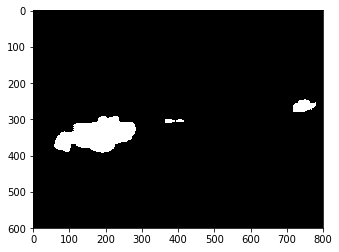

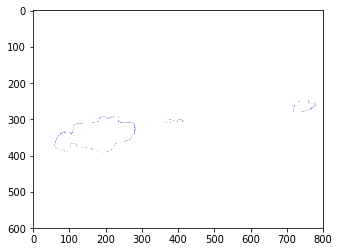

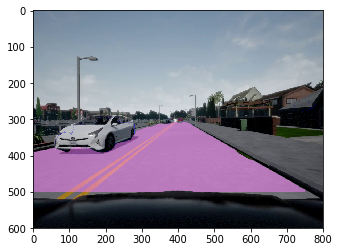

 frame:  15


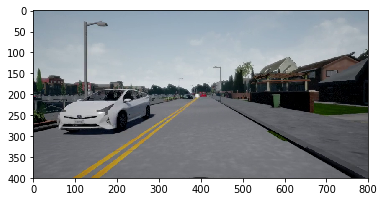

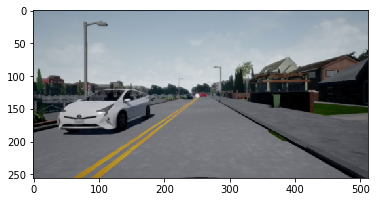

road_img_int.shape :  (256, 512, 1)


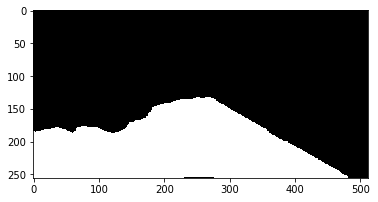

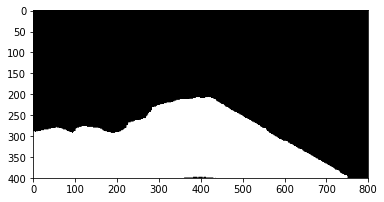

padding_XXX_int.shape :  (600, 800)


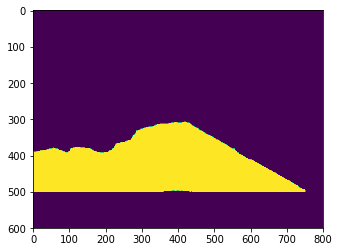

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


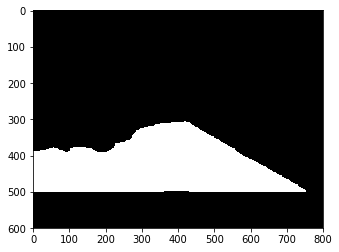

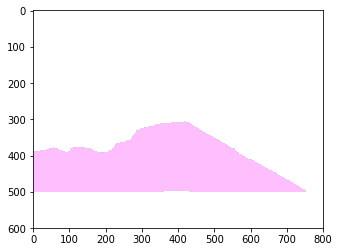

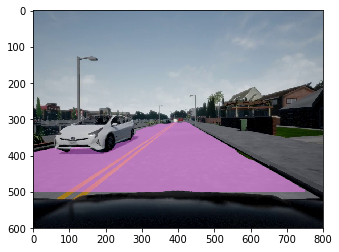

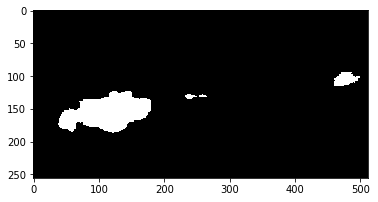

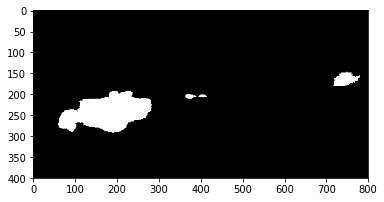

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


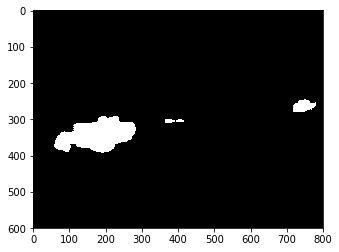

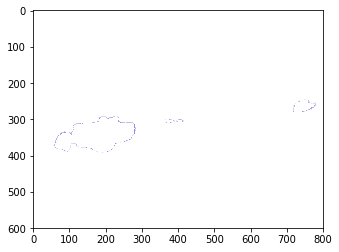

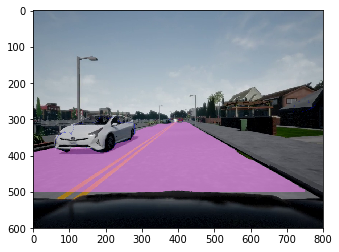

 frame:  16


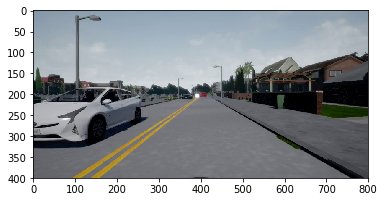

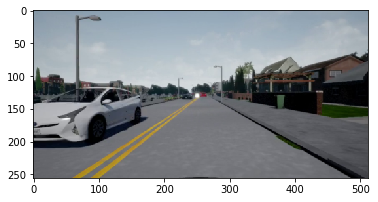

road_img_int.shape :  (256, 512, 1)


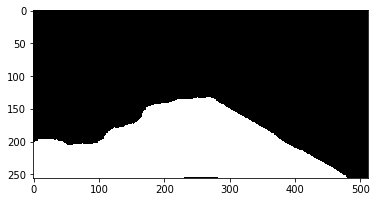

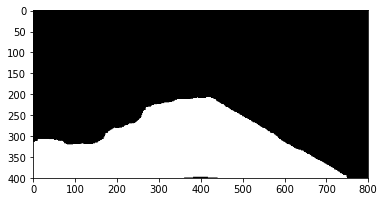

padding_XXX_int.shape :  (600, 800)


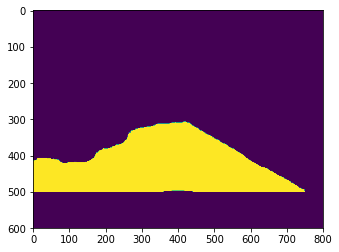

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


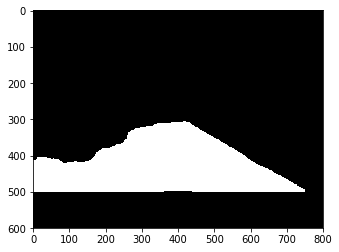

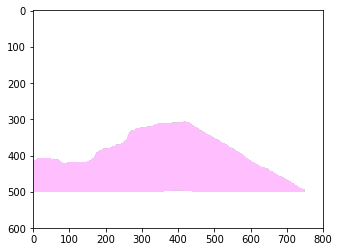

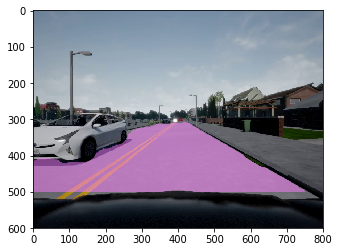

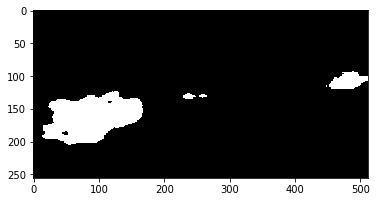

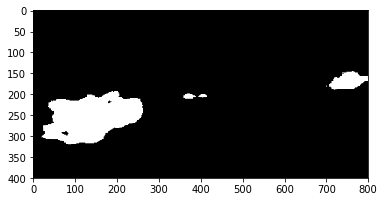

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


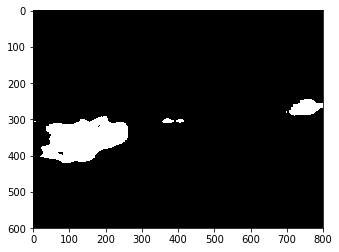

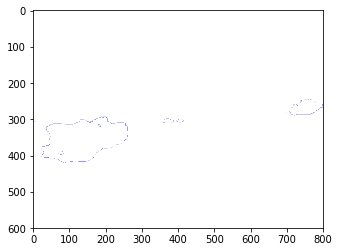

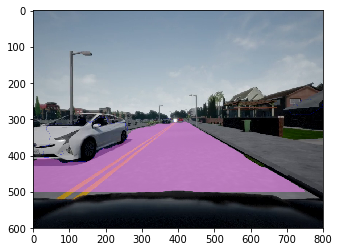

 frame:  17


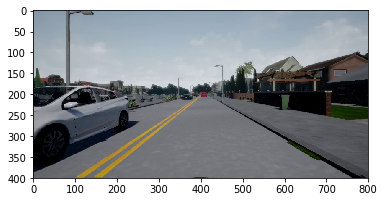

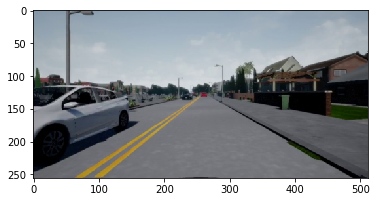

road_img_int.shape :  (256, 512, 1)


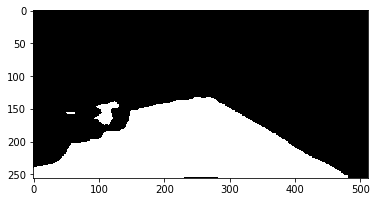

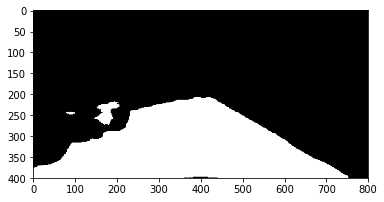

padding_XXX_int.shape :  (600, 800)


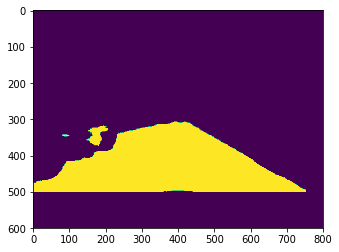

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


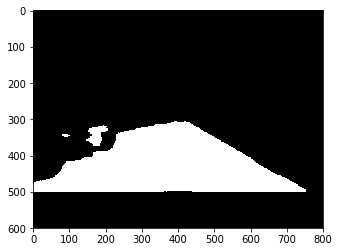

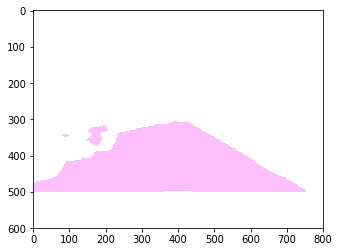

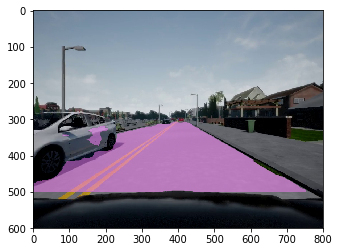

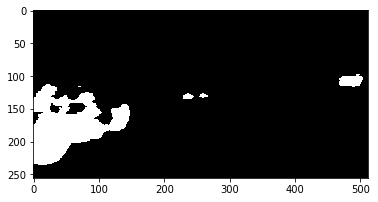

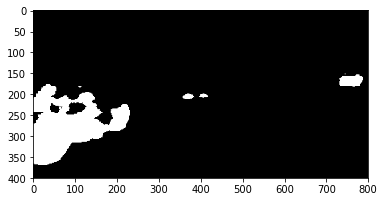

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


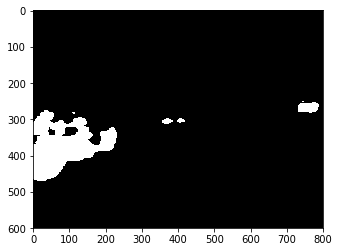

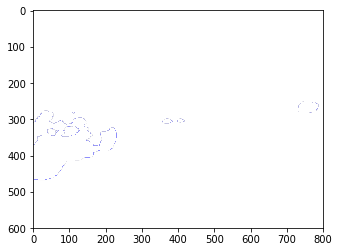

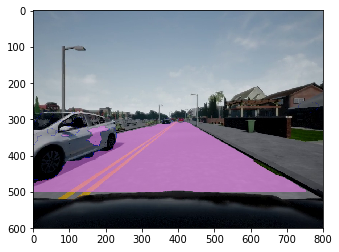

 frame:  18


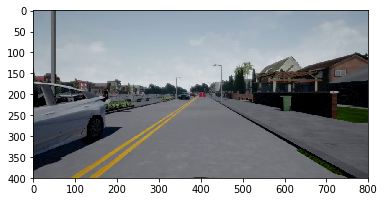

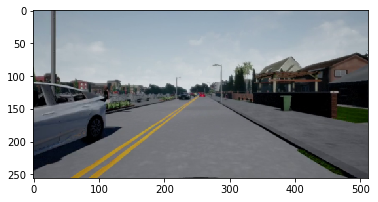

road_img_int.shape :  (256, 512, 1)


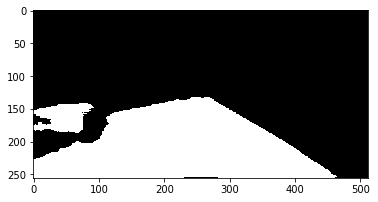

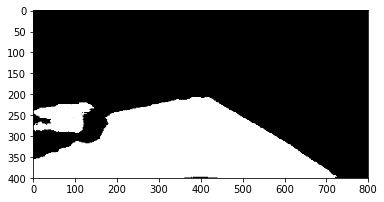

padding_XXX_int.shape :  (600, 800)


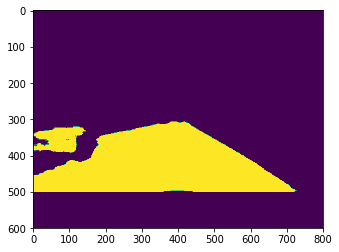

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


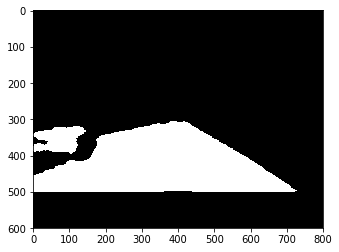

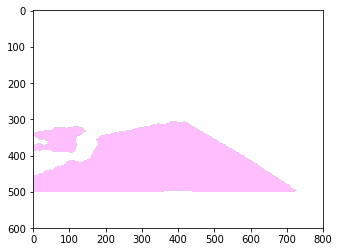

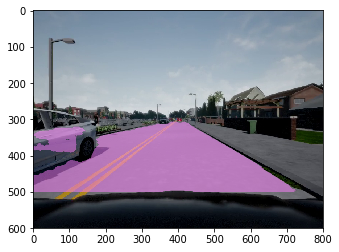

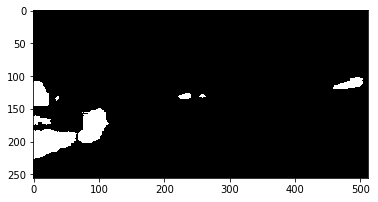

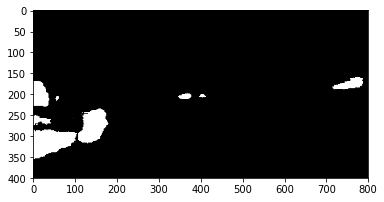

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


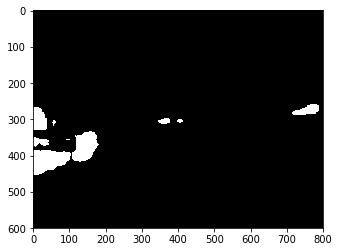

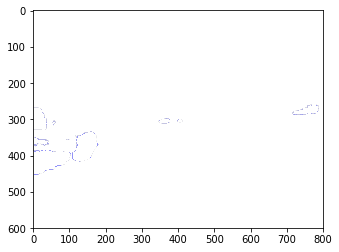

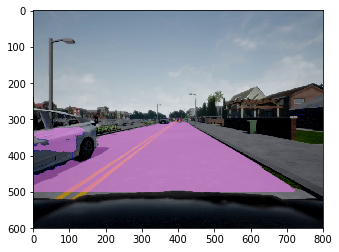

 frame:  19


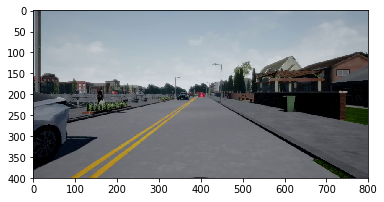

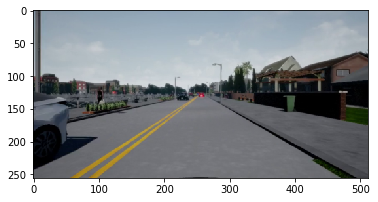

road_img_int.shape :  (256, 512, 1)


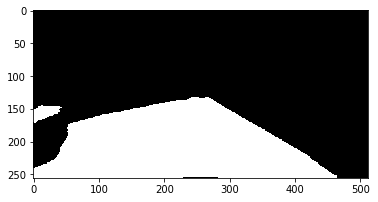

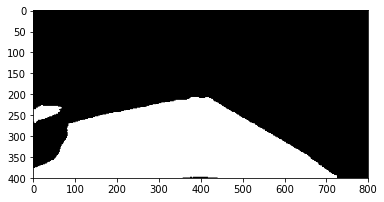

padding_XXX_int.shape :  (600, 800)


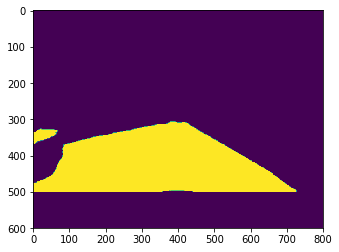

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


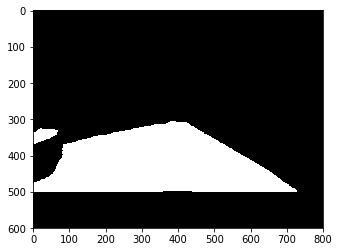

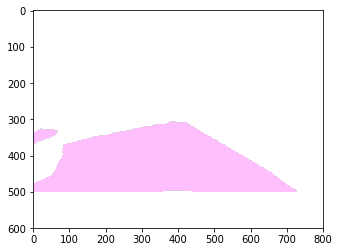

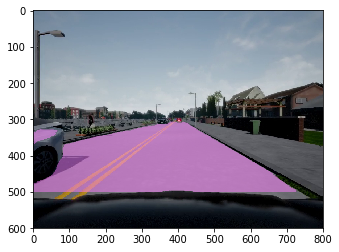

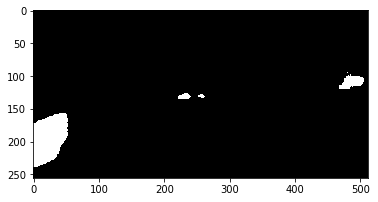

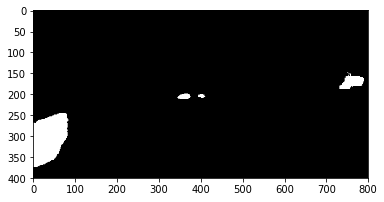

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


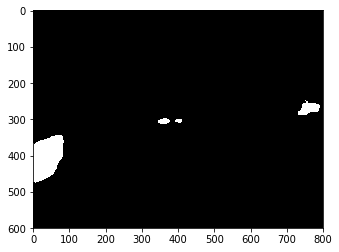

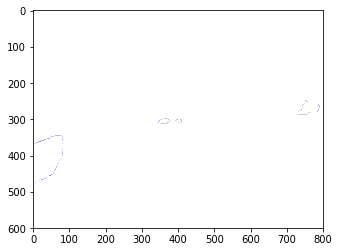

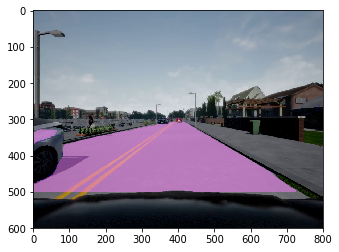

 frame:  20


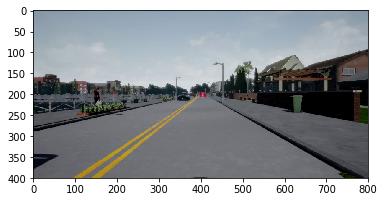

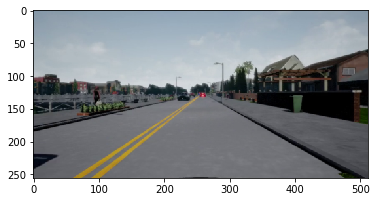

road_img_int.shape :  (256, 512, 1)


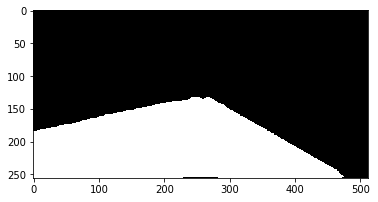

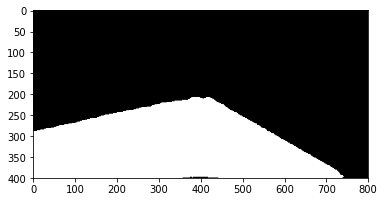

padding_XXX_int.shape :  (600, 800)


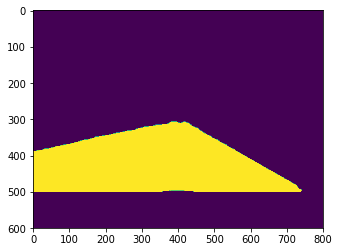

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


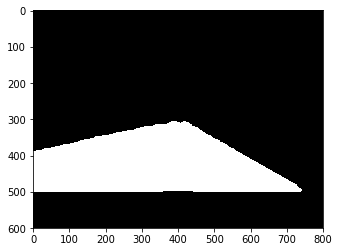

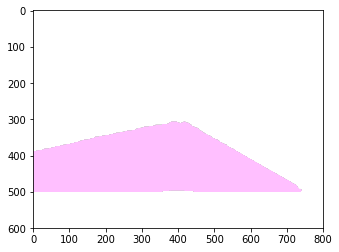

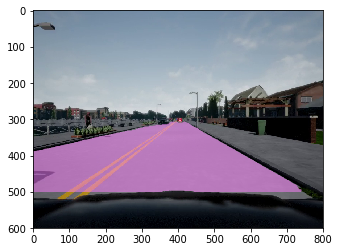

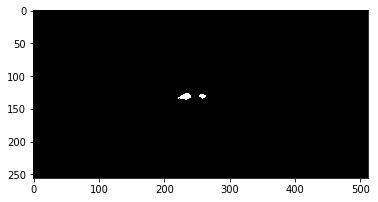

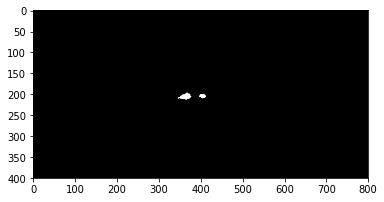

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


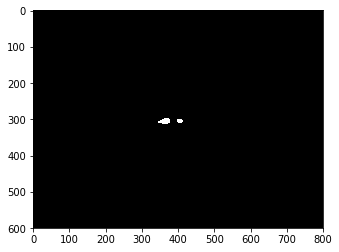

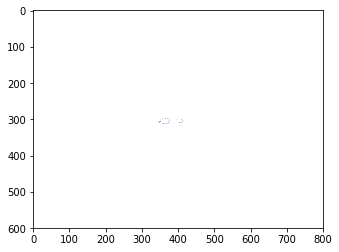

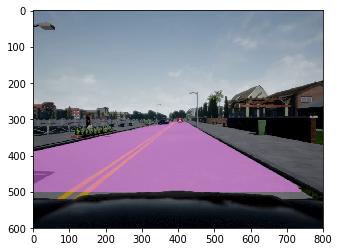

 frame:  21


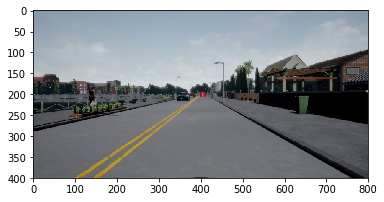

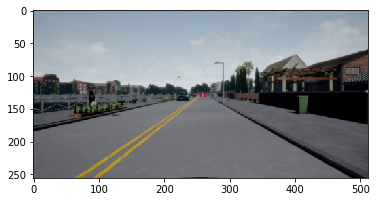

road_img_int.shape :  (256, 512, 1)


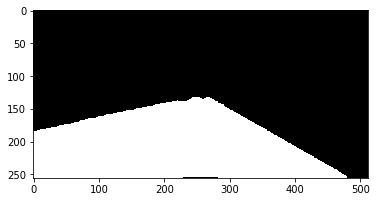

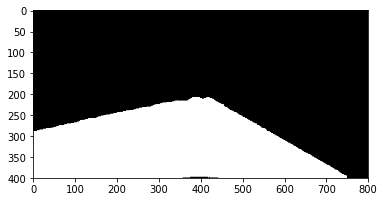

padding_XXX_int.shape :  (600, 800)


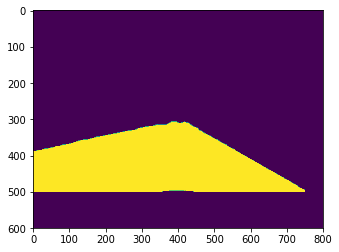

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


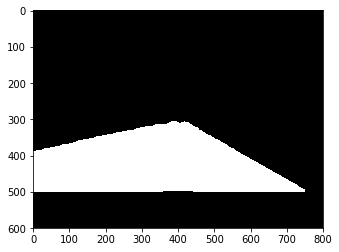

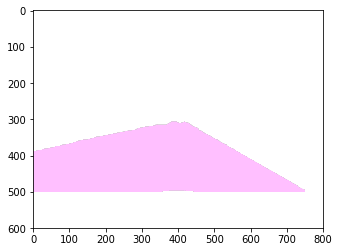

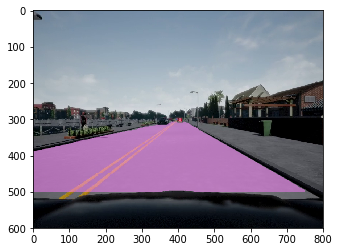

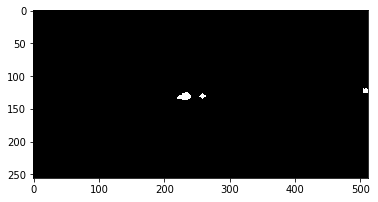

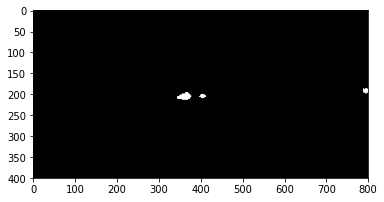

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


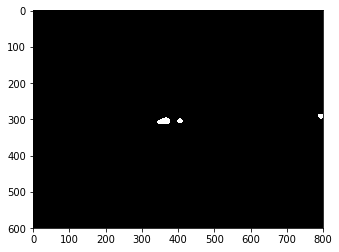

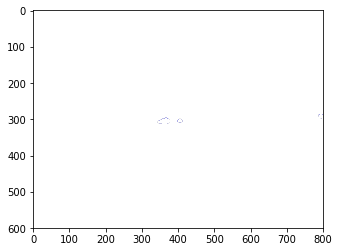

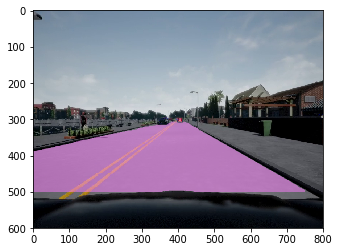

 frame:  22


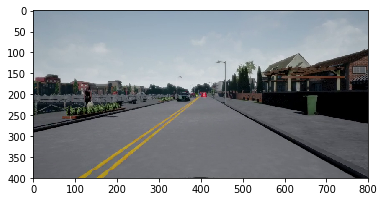

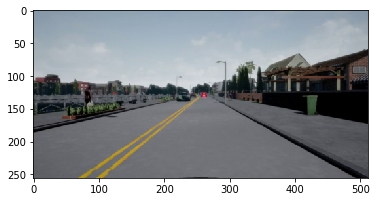

road_img_int.shape :  (256, 512, 1)


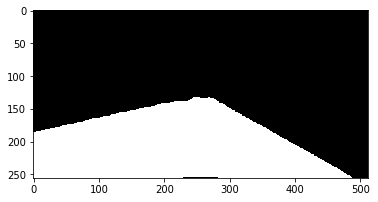

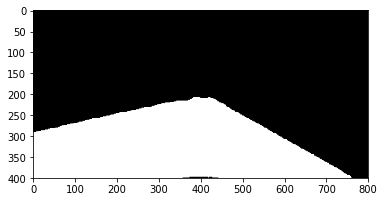

padding_XXX_int.shape :  (600, 800)


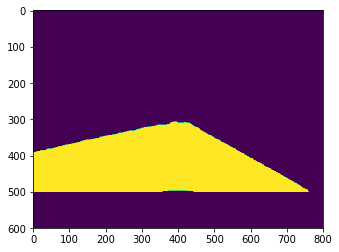

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


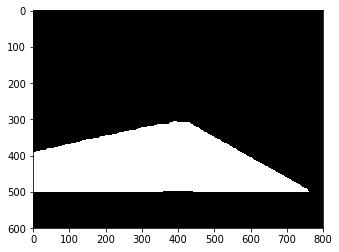

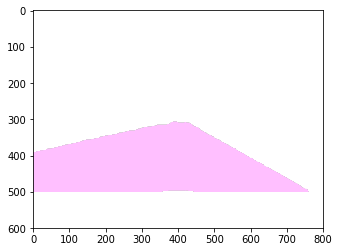

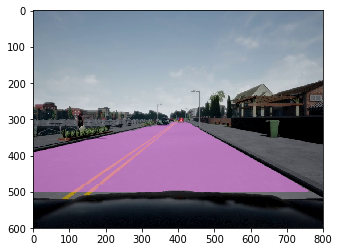

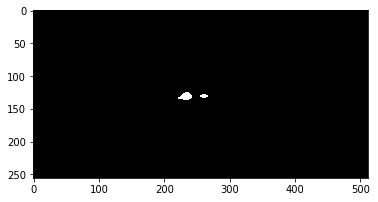

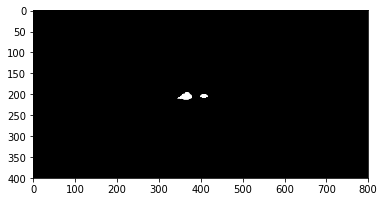

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


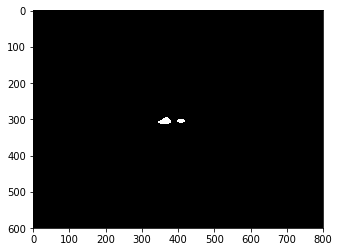

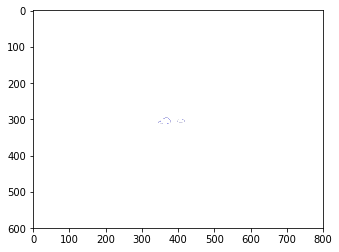

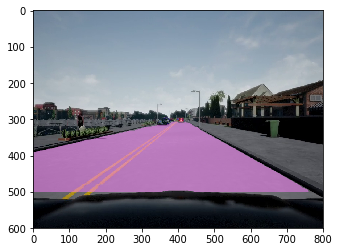

 frame:  23


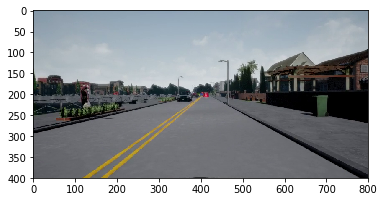

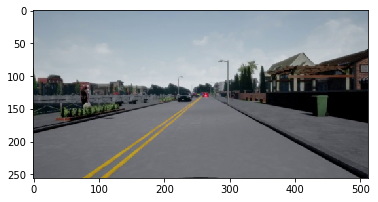

road_img_int.shape :  (256, 512, 1)


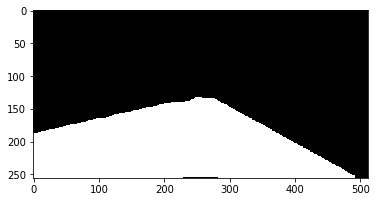

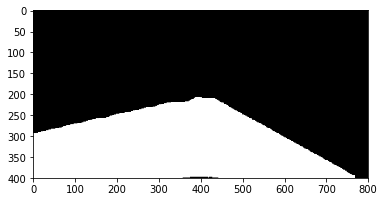

padding_XXX_int.shape :  (600, 800)


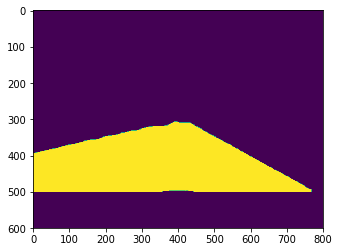

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


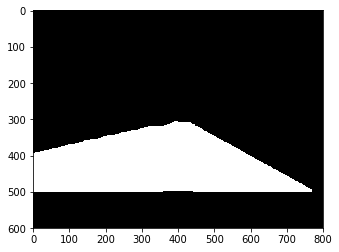

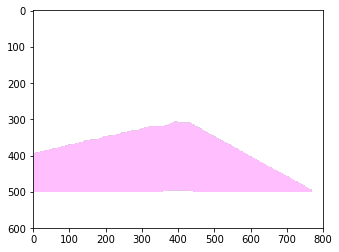

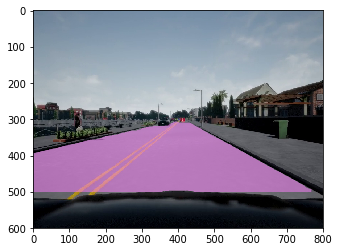

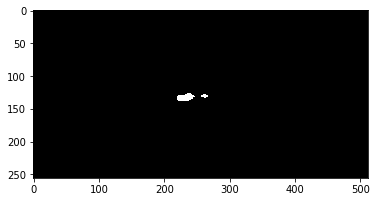

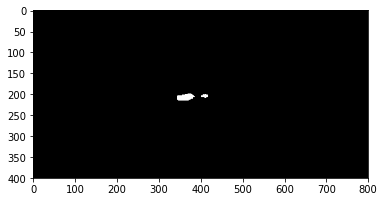

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


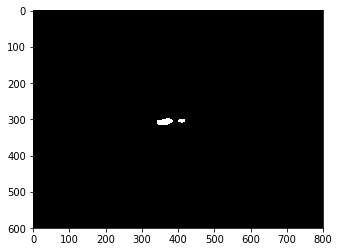

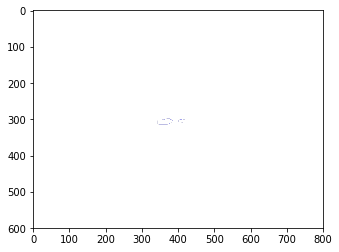

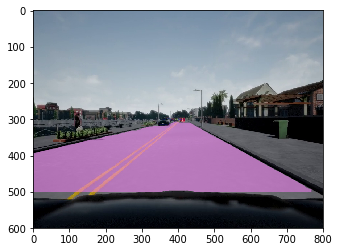

 frame:  24


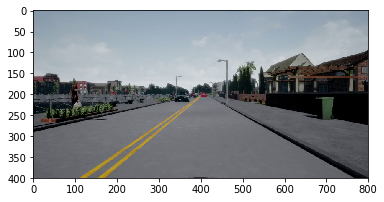

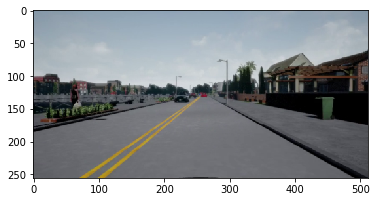

road_img_int.shape :  (256, 512, 1)


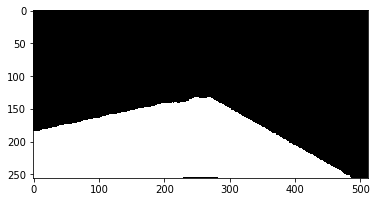

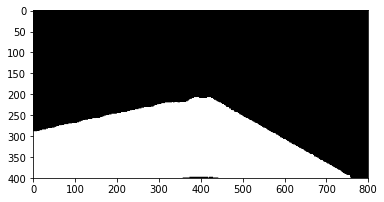

padding_XXX_int.shape :  (600, 800)


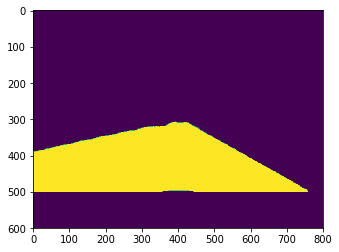

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


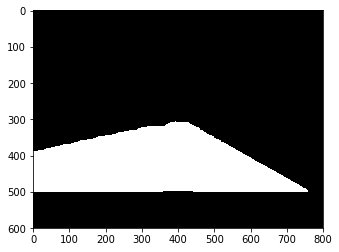

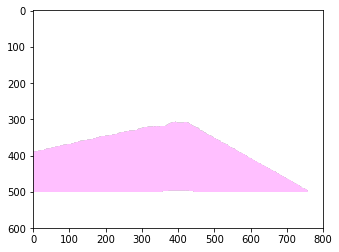

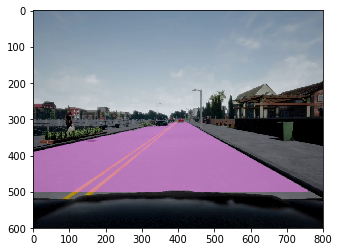

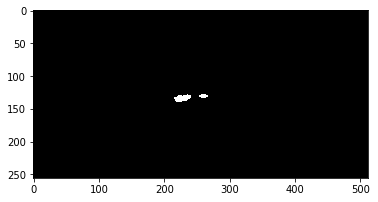

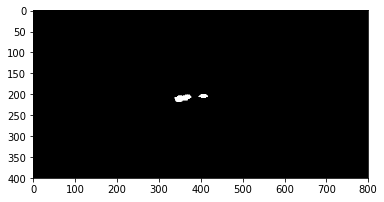

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


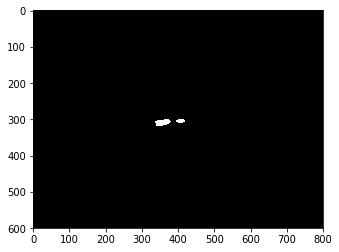

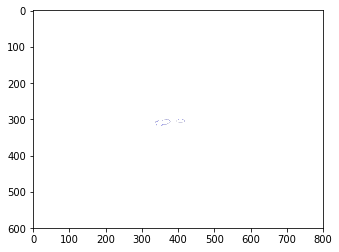

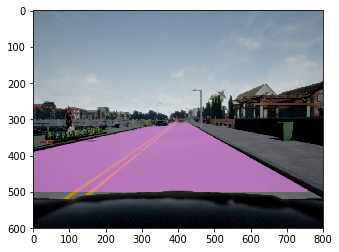

 frame:  25


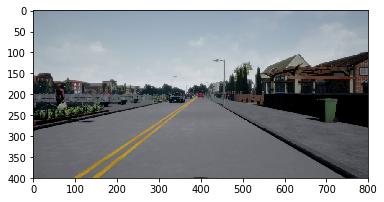

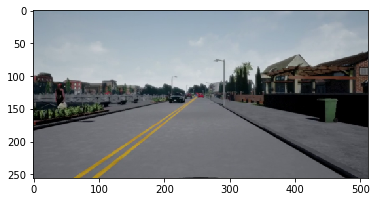

road_img_int.shape :  (256, 512, 1)


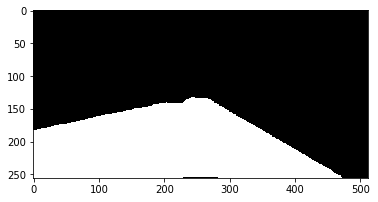

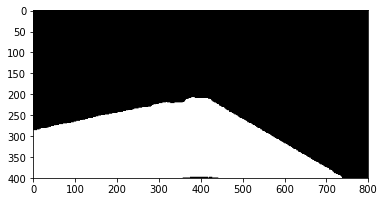

padding_XXX_int.shape :  (600, 800)


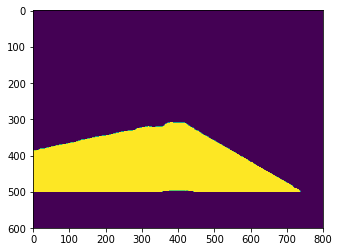

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


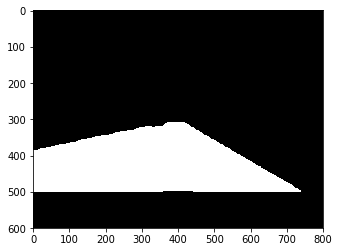

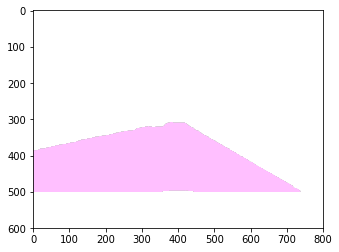

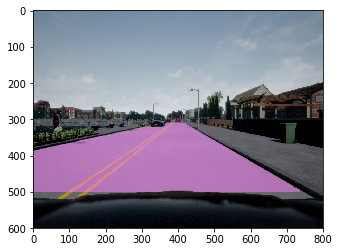

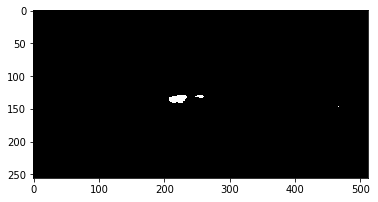

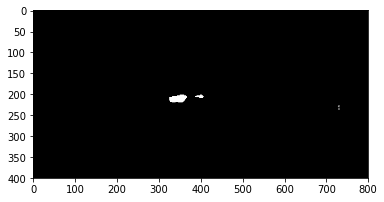

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


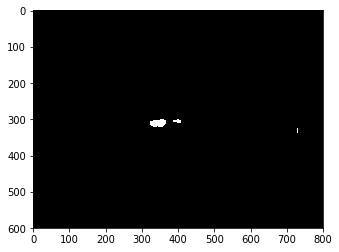

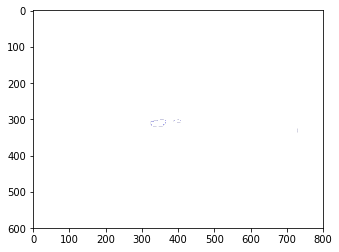

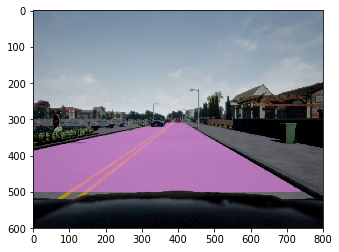

 frame:  26


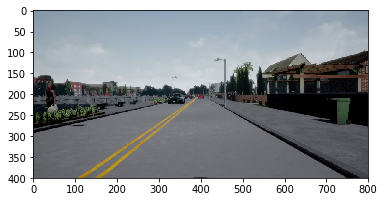

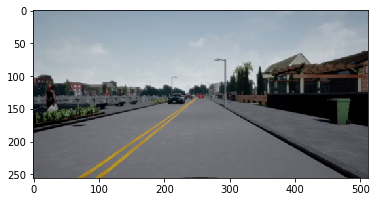

road_img_int.shape :  (256, 512, 1)


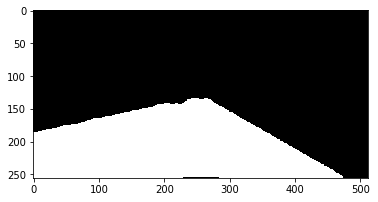

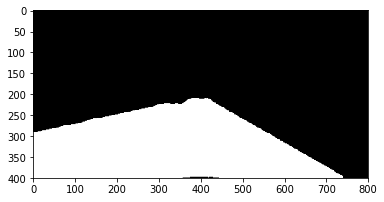

padding_XXX_int.shape :  (600, 800)


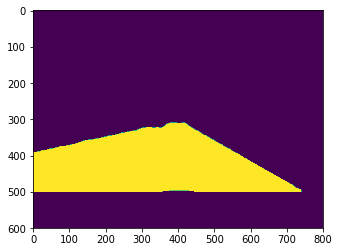

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


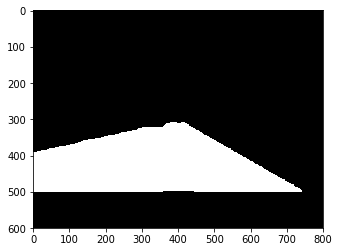

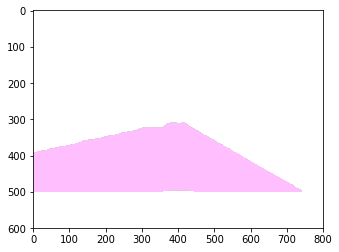

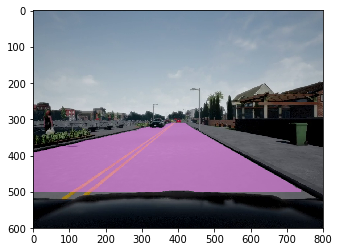

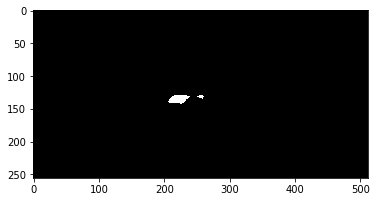

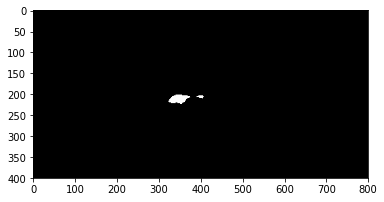

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


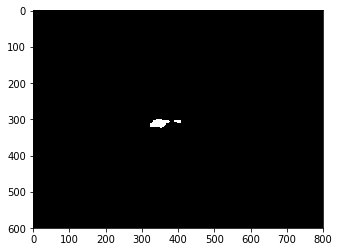

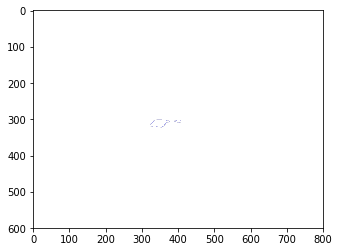

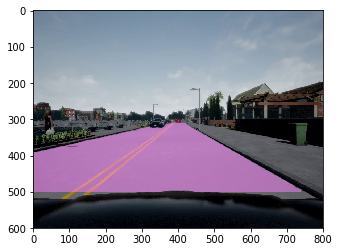

 frame:  27


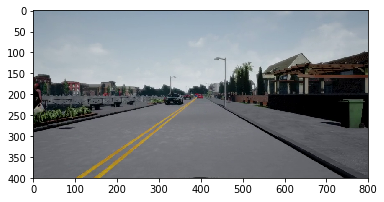

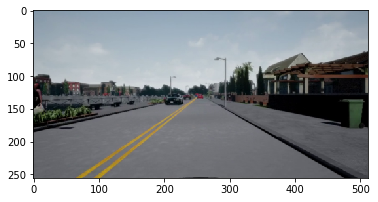

road_img_int.shape :  (256, 512, 1)


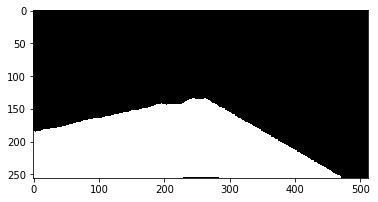

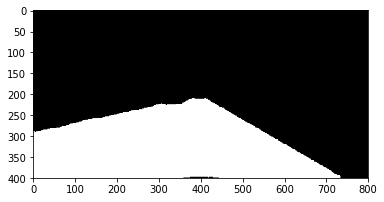

padding_XXX_int.shape :  (600, 800)


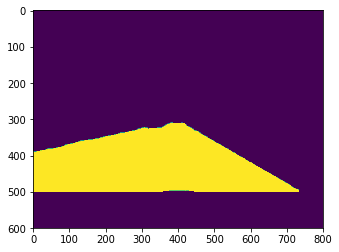

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


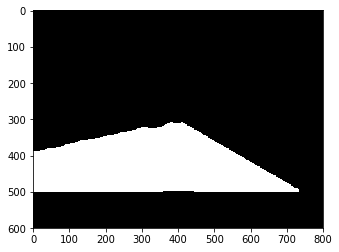

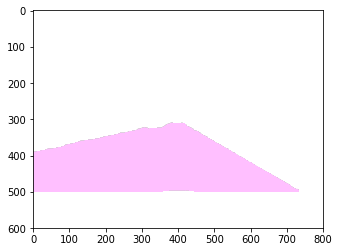

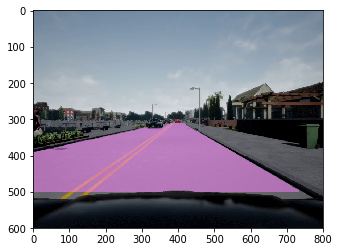

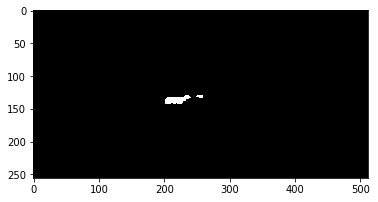

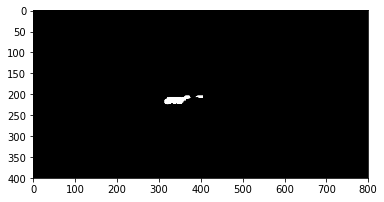

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


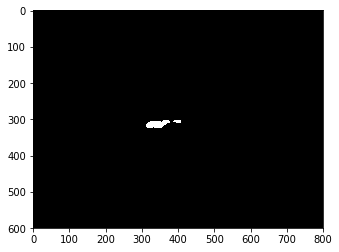

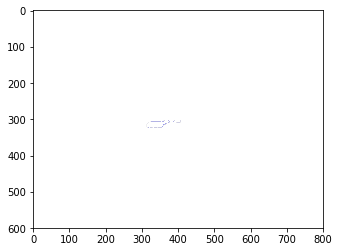

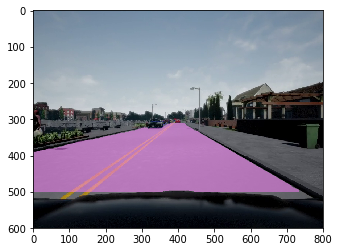

 frame:  28


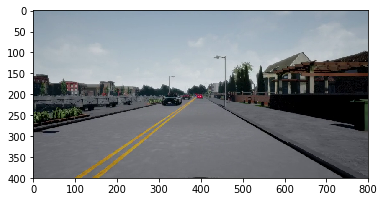

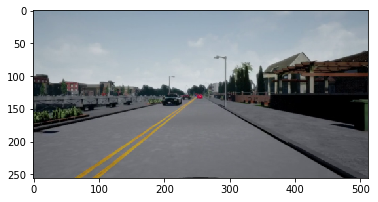

road_img_int.shape :  (256, 512, 1)


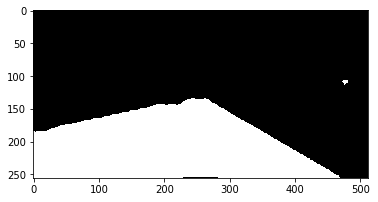

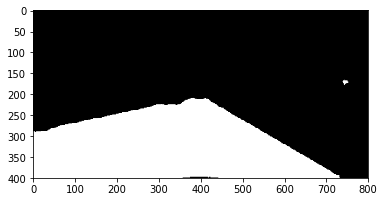

padding_XXX_int.shape :  (600, 800)


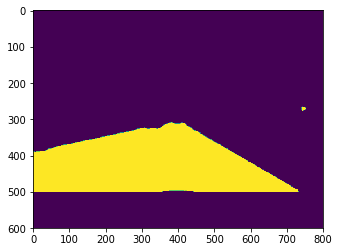

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


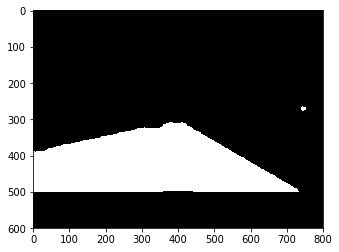

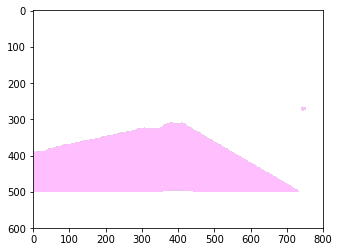

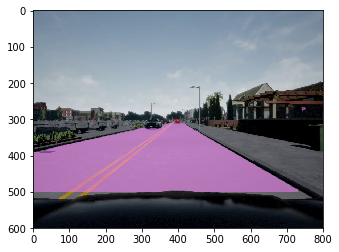

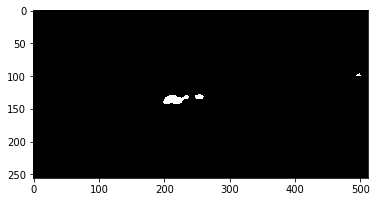

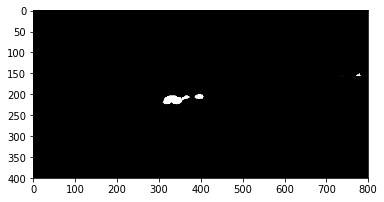

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


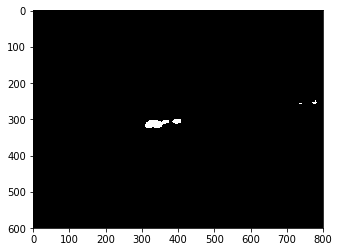

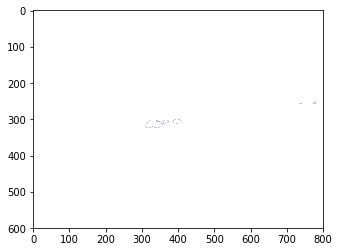

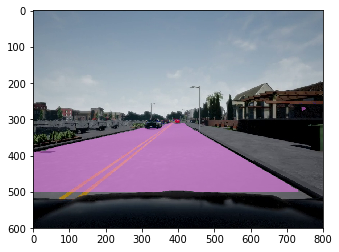

 frame:  29


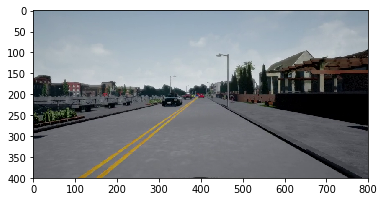

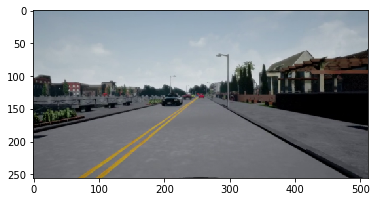

road_img_int.shape :  (256, 512, 1)


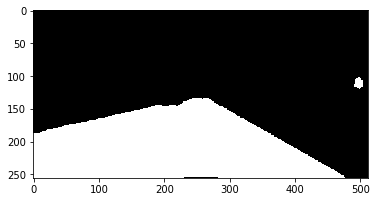

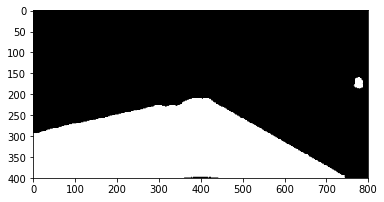

padding_XXX_int.shape :  (600, 800)


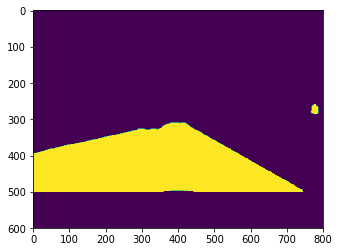

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


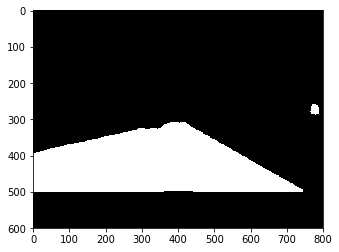

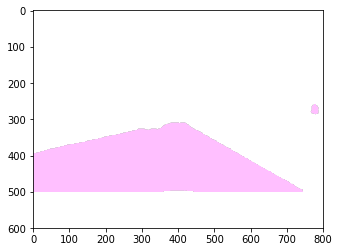

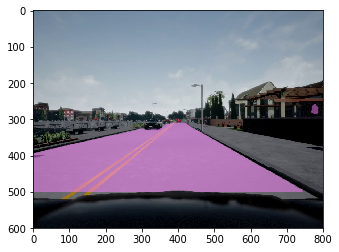

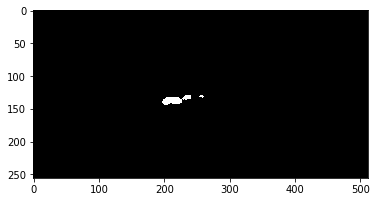

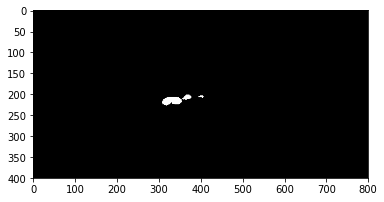

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


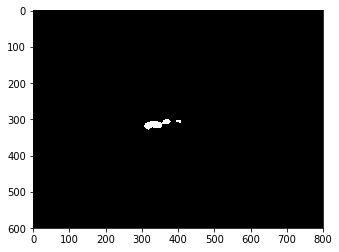

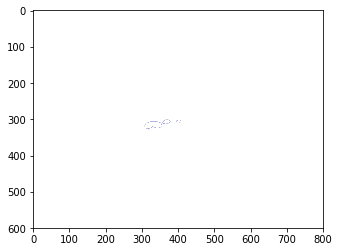

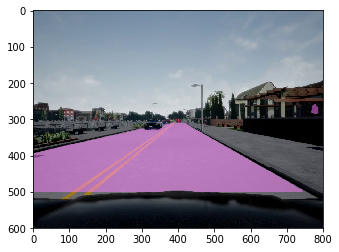

 frame:  30


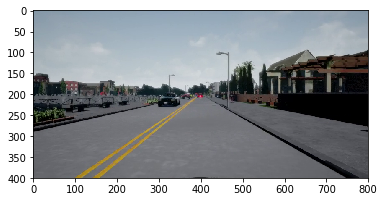

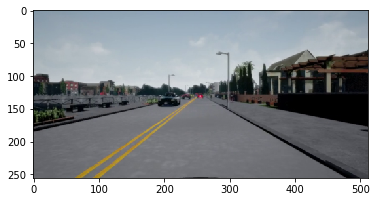

road_img_int.shape :  (256, 512, 1)


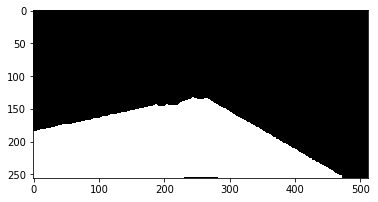

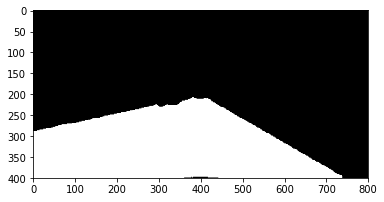

padding_XXX_int.shape :  (600, 800)


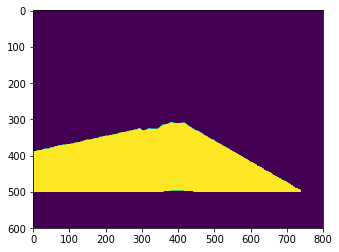

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_road_int_1.shape :  (600, 800, 1)


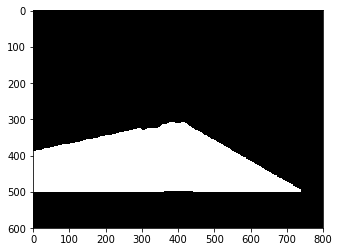

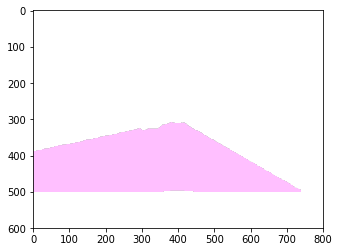

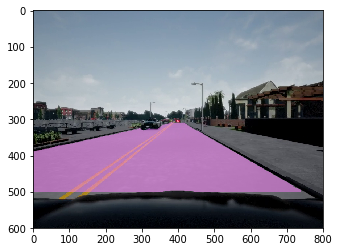

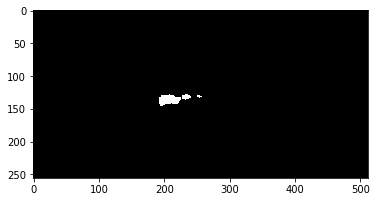

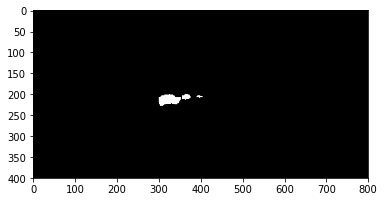

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


padding_XXX_int.shape :  (600, 800)
padding_car_int_1.shape :  (600, 800, 1)


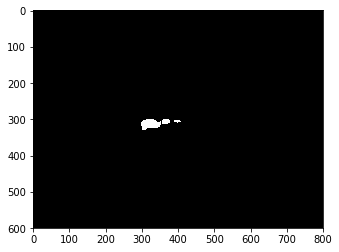

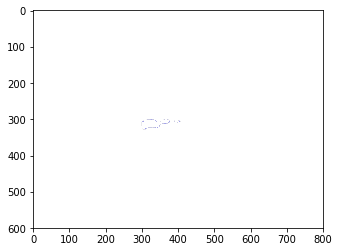

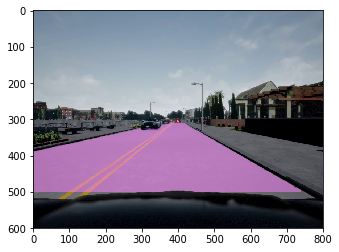

 frame:  31


In [14]:
#--------------------------
#  single image pipeline
#--------------------------

video = skvideo.io.vread('./test_video.mp4')

    
answer_key = {}

#sess, image_place_holder, logits, keep_prob = inference()





new_saver = tf.train.import_meta_graph('./models_lyft/20epoch/cont_epoch_19.ckpt.meta')
#new_saver = tf.train.import_meta_graph('./models_lyft/25epoch/cont_epoch_24.ckpt.meta')
graph = tf.get_default_graph()


with tf.Session() as sess:
    new_saver.restore(sess, "./models_lyft/20epoch/cont_epoch_19.ckpt")
    #new_saver.restore(sess, "./models_lyft/25epoch/cont_epoch_24.ckpt")
    
    input = graph.get_tensor_by_name('image_input:0')
    #print(input)
    logits = sess.graph.get_tensor_by_name('logits:0')
    #print(logits)
    keep_prob = graph.get_tensor_by_name('keep_prob:0')
    #print(keep_prob)
    image_place_holder = input 
    frame = 1

    for rgb_frame in video:
        road_binary, car_binary = single_img_inference(rgb_frame, IMAGE_SHAPE, sess, image_place_holder, logits, keep_prob)
        answer_key[frame] = [encode(road_binary), encode(car_binary)]
        print(" frame: ", frame)
        frame += 1

# Print output in proper json format
#print (json.dumps(answer_key))